# Plotly

Plotly - библиотека для визуализации данных, состоящая из нескольких частей:

- Front-End на JS

- Back-End на Python (за основу взята библиотека Seaborn)

- Back-End на R

Документация - https://plotly.com/graphing-libraries/

Так же на базе plotly и веб-сервера Flask существует специальная библиотека для создания дашбордов Dash - https://dash.plotly.com/

- **Plotly - бесплатная библиотека, которую вы можете использовать в коммерческих целях**

- Plotly работает offline

- Plotly позволяет строить **интерактивные** визуализации

Т.е. с помощью Plotly можно как изучать какие-то данные "на лету" (не перестраивая график в matplotlib, изменяя масштаб, включая/выключая какие-то данные), так и построить полноценный интерактивный отчёт (дашборд).


Для начала необходимо установить библиотеку, т.к. она не входит ни в стандартный пакет, ни в Anaconda. Для этого рекомендуется использовать pip:

<code>pip install plotly</code>

Если вы используете Jupyter Notebook, то можно использовать мэджик "!", поставив данный символ перед командой:

<code>!pip install plotly</code>

In [1]:
!pip install plotly

Defaulting to user installation because normal site-packages is not writeable


Перед началом работы необходимо импортировать модуль. В разных частях урока для разных задач нам понадобятся как основной модуль, так и один из его подмодулей, поэтому полный набор инструкций импорта у нас:


<code>import plotly
import plotly.graph_objs as go
import plotly.express as px
from plotly.subplots import make_subplots
</code>

Так же нам понадобятся библиотеки Pandas и Numpy для работы с сырыми данными

In [2]:
import plotly
import plotly.graph_objs as go
import plotly.express as px
from plotly.subplots import make_subplots

import numpy as np
import pandas as pd

## Линейный график

Начнём с простой задачи построения графика по точкам. 

Используем функцию $f(x) = x^2$

Сперва поступим совсем просто и "в лоб":

- Создадим график с помощью функции scatter из подмодуля plotly.express (внутрь передадим 2 списка точек: координаты X и Y)

- Тут же "покажем" его с помозью метода show()

Обратите внимание - график интерактивный, если навести на него курсор, то можно его приближать и удалять, выделять участки, по наведению курсора на точку получать подробную информацию, возвращать картинку в исходное положение, а при необходимости "скриншотить" и сохранять как файл.

Всё это делается с помощью JS в вашем браузере. А значит, при желании вы можете этим управлять уже после построения фигуры (но мы этого делать пожалуй не будем, т.к. JS != Python)

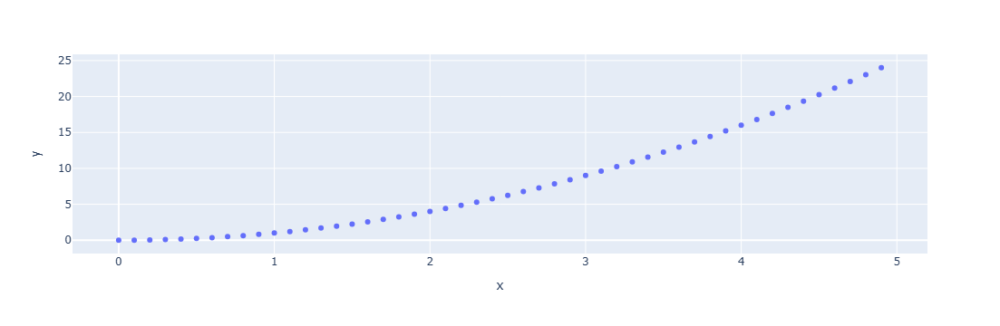

In [3]:
x = np.arange(0, 5, 0.1)
def f(x):
    return x**2

px.scatter(x=x, y=f(x)).show()

Более читабельно и правильно записать тот же в код в следующем виде:

<code>fig = px.scatter(x=x, y=f(x))
fig.show()</code>

- Создаём фигуру
- Рисуем график
- Показываем фигуру

2 строчки и готовый результат. Т.к. мы используем Express. Быстро и просто.

Но маловато гибкости, поэтому мы практически сразу переходим к более продвинутому уровню, похожему на принципы, которые мы использовали в конце <a href="https://stepik.org/lesson/196432/">урока по matplotlib</a> - сразу создадим фигуру и нанесём на неё объекты.

Так же сразу выведем фигуру для показа с помощью метода show().

*В отличие от Matplotlib отдельные объекты осей не создаются, хотя мы с ними ещё столкнёмся, когда захотим построить несколько графиков вместе*

<code>fig = go.Figure()
#Здесь будет код
fig.show()</code>

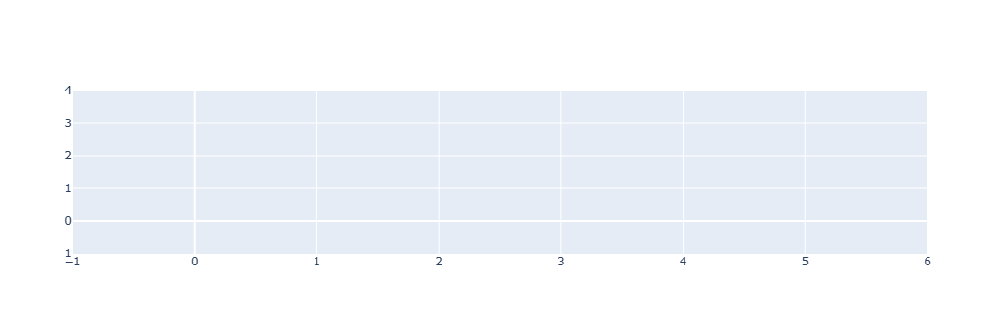

In [4]:
fig = go.Figure()
#Здесь будет код
fig.show()

Как видим, пока пусто.

Чтобы добавить что на график нам понадобится метод фигуры add_trace.

<code>fig.add_trace(ТУТ_ТО_ЧТО_ХОТИМ_ПЕРЕДАТЬ_ДЛЯ_ОТОБРАЖЕНИЯ_И_ГДЕ)</code>

Но ЧТО мы хотим нарисовать? График по точкам. График мы уже рисовали с помощью Scatter в Экспрессе, у Объектов есть свой Scatter, давайте глянем что он делает:

<code>go.Scatter(x=x, y=f(x))</code>

In [5]:
go.Scatter(x=x, y=f(x))

Scatter({
    'x': array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. , 1.1, 1.2, 1.3,
                1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2. , 2.1, 2.2, 2.3, 2.4, 2.5, 2.6, 2.7,
                2.8, 2.9, 3. , 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4. , 4.1,
                4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9]),
    'y': array([0.000e+00, 1.000e-02, 4.000e-02, 9.000e-02, 1.600e-01, 2.500e-01,
                3.600e-01, 4.900e-01, 6.400e-01, 8.100e-01, 1.000e+00, 1.210e+00,
                1.440e+00, 1.690e+00, 1.960e+00, 2.250e+00, 2.560e+00, 2.890e+00,
                3.240e+00, 3.610e+00, 4.000e+00, 4.410e+00, 4.840e+00, 5.290e+00,
                5.760e+00, 6.250e+00, 6.760e+00, 7.290e+00, 7.840e+00, 8.410e+00,
                9.000e+00, 9.610e+00, 1.024e+01, 1.089e+01, 1.156e+01, 1.225e+01,
                1.296e+01, 1.369e+01, 1.444e+01, 1.521e+01, 1.600e+01, 1.681e+01,
                1.764e+01, 1.849e+01, 1.936e+01, 2.025e+01, 2.116e+01, 2.209e+01,
                2.

А теперь объединим:
    
<code>fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=f(x)))
fig.show()</code>

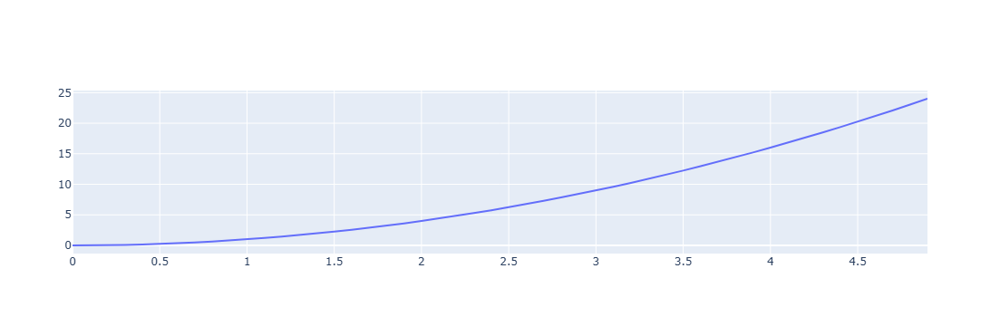

In [6]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=f(x)))
fig.show()

Как видим, отличия не только в коде, но и в результате - получилась гладкая кривая.

Кроме того, такой способ позволит нам нанести на график столько кривых, сколько мы хотим:
    
    
<code>fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=f(x)))
fig.add_trace(go.Scatter(x=x, y=x))
fig.show()</code>

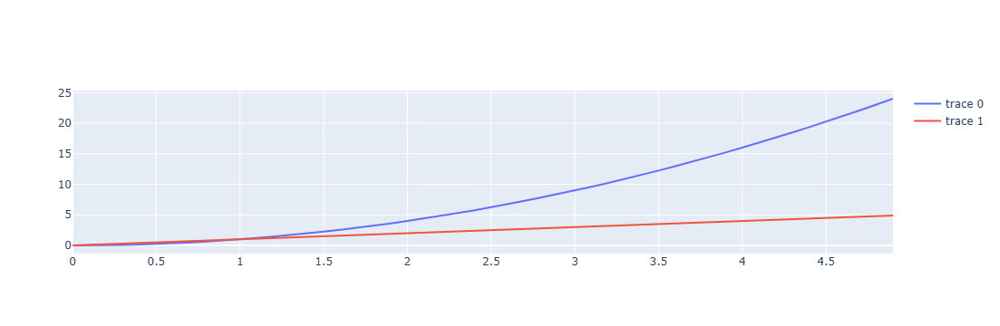

In [7]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=f(x)))
fig.add_trace(go.Scatter(x=x, y=x))
fig.show()

Погодите, что это такое? Справа появилась ещё и легенда!

Впрочем, логично, пока график был один, зачем нам легенда?

Но магия Plotly тут не заканчивается. Нажмите на любую из подписей в легенде и соответствующий график исчезнет, а надпись станет более бледной. Вернуть их позволит повторный клик.

**Подписи графиков**

Добавим атрибут name, в который передадим строку с именем графика, которое мы хотим отображать в легенде.

Plotly поддерживает LATEX в подписях (аналогично matplotlib через использование $$ с обеих сторон).

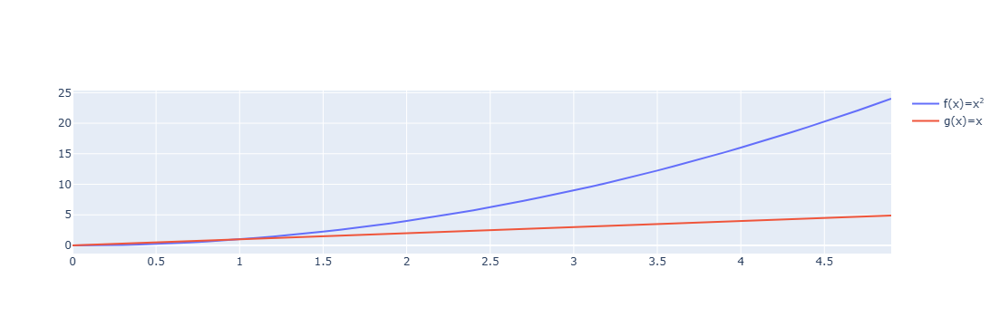

In [16]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=f(x), name='f(x)=x<sup>2<sup>'))
fig.add_trace(go.Scatter(x=x, y=x, name='g(x)=x'))
fig.show()

К сожалению, это имеет свои ограничения, как можно заметить подсказка при наведении на график отображается в "сыром" виде, а не в LATEX.

Победить это можно, если использовать HTML разметку в подписях. В данном примере я буду использовать тег <a href="http://htmlbook.ru/html/sup">sup</a>. Так же заметьте, что шрифт для LATEX и HTML отличается начертанием.

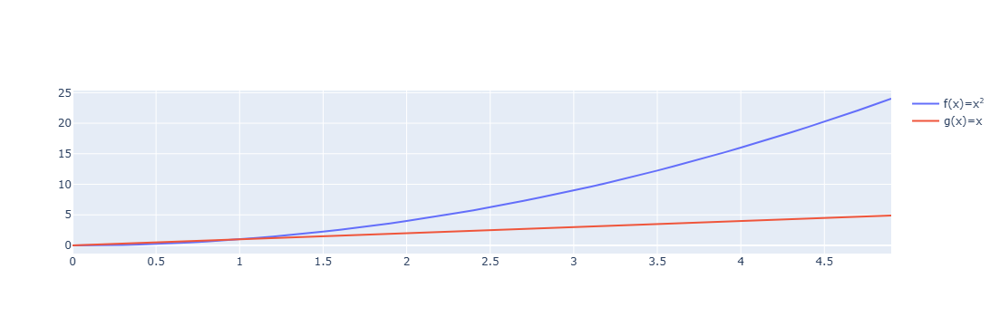

In [17]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=f(x), name='f(x)=x<sup>2</sup>'))
fig.add_trace(go.Scatter(x=x, y=x, name='g(x)=x'))
fig.show()

С увеличением длины подписи графика, легенда начала наезжать на график. Мне это не нравится, поэтому перенесём легенду вниз.

Для этого применим к фигуре метод update_layout, у которого нас интересует атрибут legend_orientation
<code>fig.update_layout(legend_orientation="h")</code>

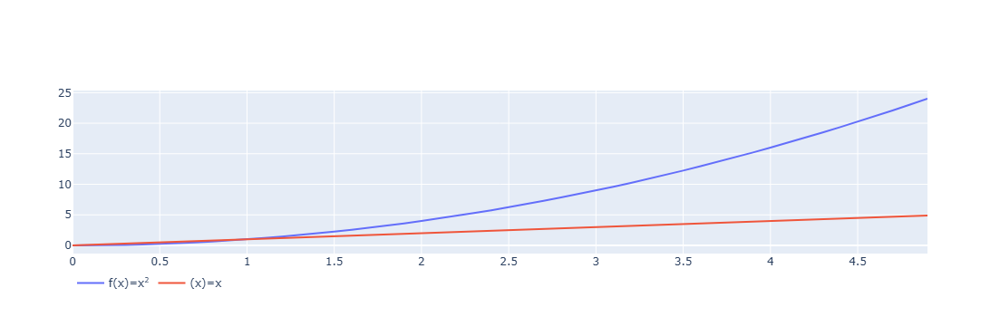

In [18]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=f(x),  name='f(x)=x<sup>2</sup>'))
fig.add_trace(go.Scatter(x=x, y=x, name='(x)=x'))
fig.update_layout(legend_orientation="h")
fig.show()

Хорошо, но слишком большая часть рабочего пространства ноутбука не используется. Особенно это заметно сверху - большой отступ сверху до поля графика.

По умолчанию поля графика имеют отступ 20 пикселей. Мы можем задать свои значения отступам с помощью update_layout, у которого есть атрибут margin, принимающий словарь из отступов:

- l - отступ слева
- r - отступ справа
- t - отступ сверху
- b - отступ снизу

Зададим везде нулевые отступы
<code>fig.update_layout(margin=dict(l=0, r=0, t=0, b=0))</code>

*update_layout можно применять последовательно несколько раз, либо можно передать все аргументы в одну функцию (мы сделаем именно так)*

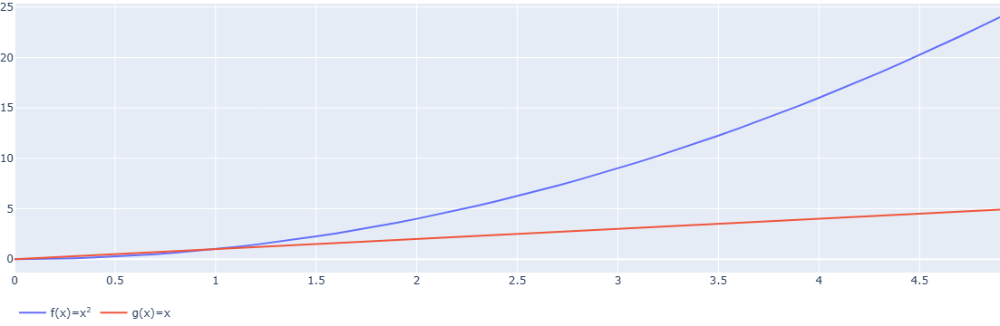

In [19]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=f(x),  name='f(x)=x<sup>2</sup>'))
fig.add_trace(go.Scatter(x=x, y=x, name='g(x)=x'))
fig.update_layout(legend_orientation="h", 
                  margin=dict(l=0, r=0, t=0, b=0))
fig.show()

Поскольку подписи в легенде короткие, мне не нравится, что они расположены слева. Я бы предпочёл выровнять их по центру.

Для этого можно использовать у update_layout атрибут legend, куда передать словарь с координатами для сдвига (*сдвиг может быть и по вертикали, но мы используем только горизонталь*).

Сдвиг задаётся в долях от ширины всей фигуры, но важно помнить, что сдвигается левый край легенды. Т.е. если мы укажем 0.5 (*50% ширины*), то надпись будет на самом деле чуть сдвинута вправо.

*Т.к. реальная ширина зависит от особенностей вашего экрана, браузера, шрифтов и т.п., то этот параметр часто приходится подгонять. Лично у меня для этого примера неплохо работает 0.43.*

Чтобы не шаманить с шириной, можно легенду относительно точки сдвига с помощью аргумента xanchor.

В итоге для легенды мы получим такой словарь:

<code>legend=dict(x=.5, xanchor="center")</code>

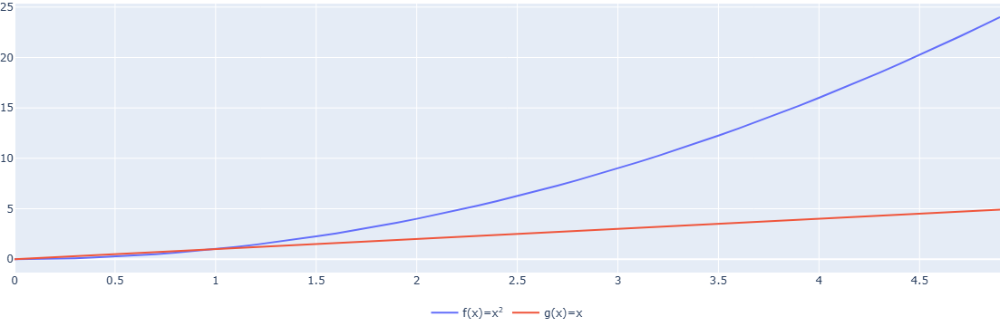

In [20]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=f(x),  name='f(x)=x<sup>2</sup>'))
fig.add_trace(go.Scatter(x=x, y=x, name='g(x)=x'))
fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  margin=dict(l=0, r=0, t=0, b=0))
fig.show()

Стоит сразу задать подписи к осям и графику в целом. Для этого нам вновь понадобится update_layout, у которого добавится 3 новых аргумента:

<code>title="Plot Title",
xaxis_title="x Axis Title",
yaxis_title="y Axis Title",</code>
    
*Следует заметить, что сдвиги, которые мы задали ранее могут негавтивно сказаться на читаемости подписей (так заголовок графика вообще вытесняется из области видимости, поэтому я увеличу отступ сверху с 0 до 30 пикселей*

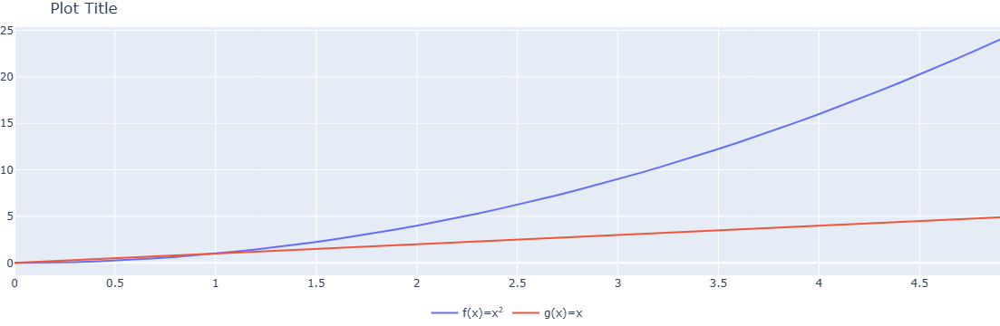

In [28]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=f(x),  name='f(x)=x<sup>2</sup>'))
fig.add_trace(go.Scatter(x=x, y=x, name='g(x)=x'))
fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  title="Plot Title",
                  margin=dict(l=0, r=0, t=30, b=0))
fig.show()

Вернёмся к самим графикам, и вспомним, что они состоят из точек. Выделим их с помощью атрибута mode у самих объектов Scatter.

Используем разные варианты выделения для демонстрации:

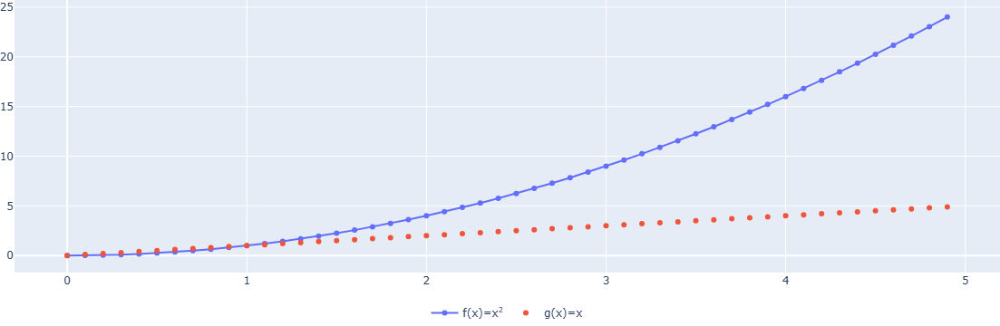

In [23]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=f(x), mode='lines+markers',  name='f(x)=x<sup>2</sup>'))
fig.add_trace(go.Scatter(x=x, y=x, mode='markers', name='g(x)=x'))
fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  margin=dict(l=0, r=0, t=0, b=0))
fig.show()

Теперь особенно заметно, что LATEX в функции $g(x)=x$ отображается некорректно при наведении курсора мыши на точки.

Давайте скроем эту информацию.

Зададим для всех графиков с помощью метода update_traces поведение при наведении. Это регулирует атрибут hoverinfo, в который передаётся маска из имён атрибутов, например, "x+y" - это только информация о значениях аргумента и функции:

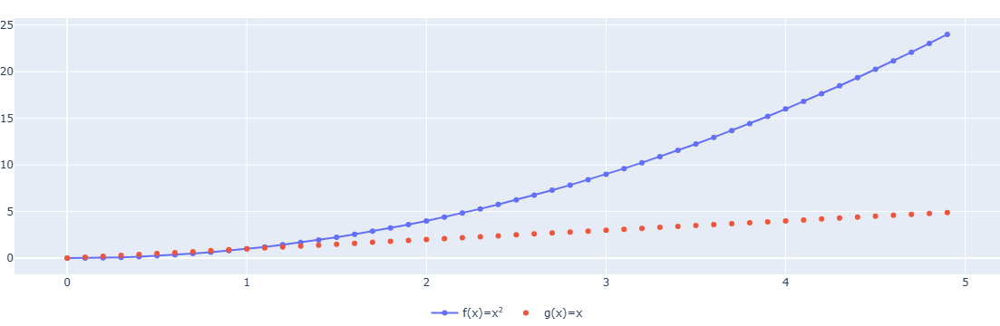

In [30]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=f(x), mode='lines+markers',  name='f(x)=x<sup>2</sup>'))
fig.add_trace(go.Scatter(x=x, y=x, mode='markers', name='g(x)=x'))
fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  margin=dict(l=0, r=0, t=20, b=0))
fig.update_traces(hoverinfo="x+y")
fig.show()

Как-то недостаточно наглядно, не находите?

Давайте разрешим использовать информацию из всех аргументов и сами зададим шаблон подсказки.

- hoverinfo="all"

- в hovertemplate передаём строку, используем HTML для форматирования, а имена переменных берём в фигурные скобки и выделяем %, например, %{x}

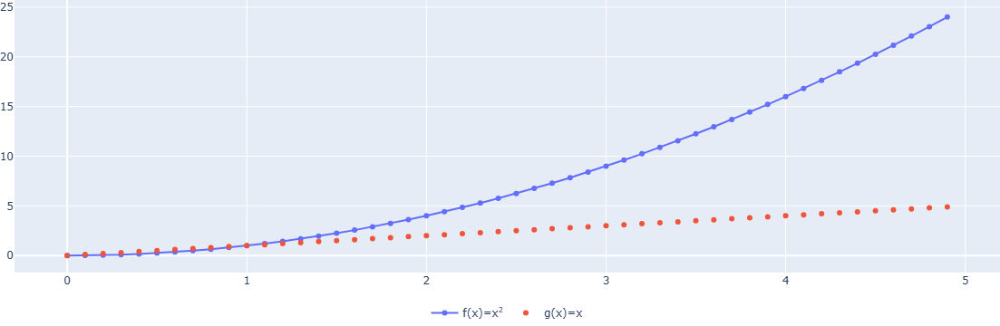

In [31]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=f(x), mode='lines+markers',  name='f(x)=x<sup>2</sup>'))
fig.add_trace(go.Scatter(x=x, y=x, mode='markers', name='g(x)=x'))
fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

А что если мы хотим сравнить информацию на 2 кривых в точках, например, с одинаковых аргументом?

Т.к. это касается всей фигуры, нам нужен update_layout и его аргумент hovermode.

In [17]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=f(x), mode='lines+markers',  name='f(x)=x<sup>2</sup>'))
fig.add_trace(go.Scatter(x=x, y=x, mode='markers', name='g(x)=x'))
fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  hovermode="x",
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

Кстати, маркерами можно управлять для конкретной кривой и явно.

Для этого используется аргумент marker, который принимает на вход словарь. Подробный пример - https://plotly.com/python/marker-style/

А мы лишь ограничимся баловством:

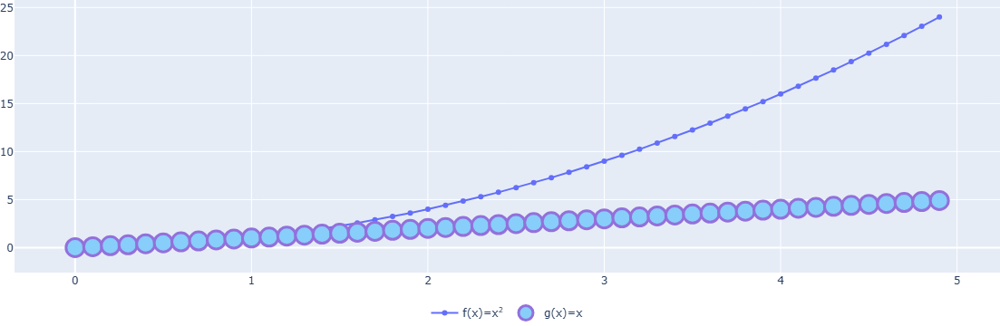

In [33]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=f(x), mode='lines+markers',  name='f(x)=x<sup>2</sup>'))
fig.add_trace(go.Scatter(x=x, y=x, mode='markers',name='g(x)=x',
                         marker=dict(color='LightSkyBlue', size=20, line=dict(color='MediumPurple', width=3))))
fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  hovermode="x",
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

Кажется теперь на графике плохо видно ту часть, где кривые пересекаются (вероятно наиболее интересную для нас).

Для этого у нас есть методы фигуры:

- update_yaxes - ось Y (вертикаль)
- update_xaxes - ось X (горизонталь)

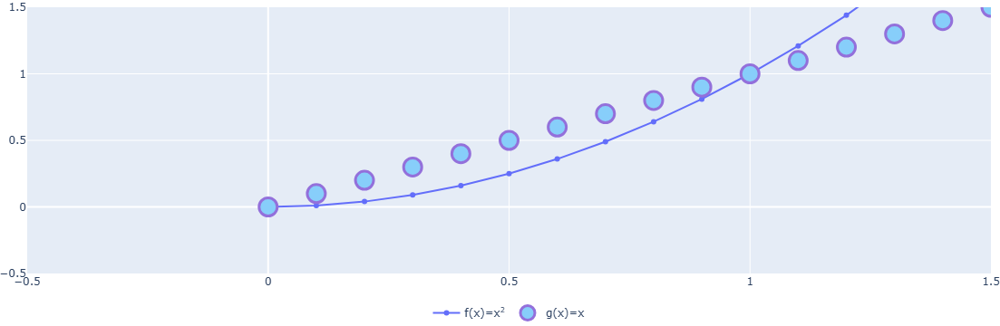

In [34]:
fig = go.Figure()
fig.update_yaxes(range=[-0.5, 1.5])
fig.update_xaxes(range=[-0.5, 1.5])
fig.add_trace(go.Scatter(x=x, y=f(x), mode='lines+markers',  name='f(x)=x<sup>2</sup>'))
fig.add_trace(go.Scatter(x=x, y=x, mode='markers',name='g(x)=x',
                         marker=dict(color='LightSkyBlue', size=20, line=dict(color='MediumPurple', width=3))))
fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  hovermode="x",
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

Хорошо, но правильно было бы нанести осевые линии.

Для этого у тех же функций есть 3 атрибута:
    
- zeroline - выводить или нет осевую линию

- zerolinewidth - задаёт толщину осевой (в пикселях)

- zerolinecolor - задаёт цвет осевой (строка, можно указать название цвета, можно его код, как принято в HTML разметке - http://htmlbook.ru/css/value/color)



In [20]:
fig = go.Figure()
fig.update_yaxes(range=[-0.5, 1.5], zeroline=True, zerolinewidth=2, zerolinecolor='LightPink')
fig.update_xaxes(range=[-0.5, 1.5], zeroline=True, zerolinewidth=2, zerolinecolor='#008000')
fig.add_trace(go.Scatter(x=x, y=f(x), mode='lines+markers',  name='f(x)=x<sup>2</sup>'))
fig.add_trace(go.Scatter(x=x, y=x, mode='markers',name='g(x)=x',
                         marker=dict(color='LightSkyBlue', size=20, line=dict(color='MediumPurple', width=3))))
fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  hovermode="x",
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

Давайте добавим больше разных функций на наш график, но сделаем так, чтобы по умолчанию их не было видно.

Для этого у объекта Scatter есть специальный атрибут:
    
- visible='legendonly'

*Т.к. мы центрировали легенду относительно точки сдвига, то нам не пришлось менять величину сдвига с увеличением числа подписей.*

In [21]:
def h(x):
    return np.sin(x)

def k(x):
    return np.cos(x)

def m(x):
    return np.tan(x)


fig = go.Figure()
fig.update_yaxes(range=[-0.5, 1.5], zeroline=True, zerolinewidth=2, zerolinecolor='LightPink')
fig.update_xaxes(range=[-0.5, 1.5], zeroline=True, zerolinewidth=2, zerolinecolor='#008000')

fig.add_trace(go.Scatter(visible='legendonly', x=x, y=h(x),  name='h(x)=sin(x)'))
fig.add_trace(go.Scatter(visible='legendonly', x=x, y=k(x),  name='k(x)=cos(x)'))
fig.add_trace(go.Scatter(visible='legendonly', x=x, y=m(x),  name='m(x)=tg(x)'))

fig.add_trace(go.Scatter(x=x, y=f(x), mode='lines+markers',  name='f(x)=x<sup>2</sup>'))
fig.add_trace(go.Scatter(x=x, y=x, mode='markers',name='g(x)=x',
                         marker=dict(color='LightSkyBlue', size=20, line=dict(color='MediumPurple', width=3))))
fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  hovermode="x",
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

Наверное всё же не следует смешивать вместе тригонометрические и арифметические функции. Давайте отобразим их на разных, соседних графиках.

Для этого нам потребуется создать фигуру с несколькими осями.

Фигура с несколькими графиками создаётся с помощью подмодуля make_subplots.

Необходимо указать количество:

- row - строк

- col - столбцов

А при построении графика передать "координаты" графика в этой "матрице" (сперва строка, потом столбец)

<code>fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])</code>

In [22]:
fig = make_subplots(rows=1, cols=2)

fig.update_yaxes(range=[-0.5, 1.5], zeroline=True, zerolinewidth=2, zerolinecolor='LightPink')
fig.update_xaxes(range=[-0.5, 1.5], zeroline=True, zerolinewidth=2, zerolinecolor='#008000')

fig.add_trace(go.Scatter(x=x, y=h(x),  name='h(x)=sin(x)'), 1, 1)
fig.add_trace(go.Scatter(x=x, y=k(x),  name='k(x)=cos(x)'), 1, 1)
fig.add_trace(go.Scatter(visible='legendonly', x=x, y=m(x),  name='m(x)=tg(x)'), 1, 1)

fig.add_trace(go.Scatter(x=x, y=f(x), mode='lines+markers',  name='f(x)=x<sup>2</sup>'), 1, 2)
fig.add_trace(go.Scatter(x=x, y=x, mode='markers',name='g(x)=x',
                         marker=dict(color='LightSkyBlue', size=20, line=dict(color='MediumPurple', width=3))), 1, 2)
fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  hovermode="x",
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

Заметили, наши изменения осей применились к обоим графикам?

Естественно, если у метода, изменяющего оси указать аргументы:
    
- row - координата строки
- col - координата столбца

то можно изменить ось только на конкретном графике:

In [23]:
fig = make_subplots(rows=1, cols=2)

fig.update_yaxes(range=[-0.5, 1.5], zeroline=True, zerolinewidth=2, zerolinecolor='LightPink', col=2)
fig.update_xaxes(range=[-0.5, 1.5], zeroline=True, zerolinewidth=2, zerolinecolor='#008000', col=2)

fig.add_trace(go.Scatter(x=x, y=h(x),  name='h(x)=sin(x)'), 1, 1)
fig.add_trace(go.Scatter(x=x, y=k(x),  name='k(x)=cos(x)'), 1, 1)
fig.add_trace(go.Scatter(visible='legendonly', x=x, y=m(x),  name='m(x)=tg(x)'), 1, 1)

fig.add_trace(go.Scatter(x=x, y=f(x), mode='lines+markers',  name='f(x)=x<sup>2</sup>'), 1, 2)
fig.add_trace(go.Scatter(x=x, y=x, mode='markers',name='g(x)=x',
                         marker=dict(color='LightSkyBlue', size=20, line=dict(color='MediumPurple', width=3))), 1, 2)
fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  hovermode="x",
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

А вот если бездумно использовать title, xaxis_title и yaxis_title для update_layout, то может выйти казус - подписи применятся только к 1 графику:

In [24]:
fig = make_subplots(rows=1, cols=2)

fig.update_yaxes(range=[-0.5, 1.5], zeroline=True, zerolinewidth=2, zerolinecolor='LightPink', col=2)
fig.update_xaxes(range=[-0.5, 1.5], zeroline=True, zerolinewidth=2, zerolinecolor='#008000', col=2)

fig.add_trace(go.Scatter(x=x, y=h(x),  name='h(x)=sin(x)'), 1, 1)
fig.add_trace(go.Scatter(x=x, y=k(x),  name='k(x)=cos(x)'), 1, 1)
fig.add_trace(go.Scatter(visible='legendonly', x=x, y=m(x),  name='m(x)=tg(x)'), 1, 1)

fig.add_trace(go.Scatter(x=x, y=f(x), mode='lines+markers',  name='f(x)=x<sup>2</sup>'), 1, 2)
fig.add_trace(go.Scatter(x=x, y=x, mode='markers',name='g(x)=x',
                         marker=dict(color='LightSkyBlue', size=20, line=dict(color='MediumPurple', width=3))), 1, 2)
fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  hovermode="x",
                  margin=dict(l=0, r=0, t=30, b=0))
fig.update_layout(title="Plot Title",
                  xaxis_title="x Axis Title",
                  yaxis_title="y Axis Title")
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

Поэтому заголовки графиков можно задать, при создании фигуры, передав в аргумент subplot_titles кортеж/список с названиями.

Подписи осей под графиками можно поменять с помощью методов фигуры:

- fig.update_xaxes

- fig.update_yaxes

Передавая в них номер строки и колонки (т.е. "координаты изменяемого графика")

In [25]:
fig = make_subplots(rows=1, cols=2, subplot_titles=("Plot 1", "Plot 2"))

fig.update_yaxes(range=[-0.5, 1.5], zeroline=True, zerolinewidth=2, zerolinecolor='LightPink', col=2)
fig.update_xaxes(range=[-0.5, 1.5], zeroline=True, zerolinewidth=2, zerolinecolor='#008000', col=2)

fig.add_trace(go.Scatter(x=x, y=h(x),  name='h(x)=sin(x)'), 1, 1)
fig.add_trace(go.Scatter(x=x, y=k(x),  name='k(x)=cos(x)'), 1, 1)
fig.add_trace(go.Scatter(visible='legendonly', x=x, y=m(x),  name='m(x)=tg(x)'), 1, 1)

fig.add_trace(go.Scatter(x=x, y=f(x), mode='lines+markers',  name='f(x)=x<sup>2</sup>'), 1, 2)
fig.add_trace(go.Scatter(x=x, y=x, mode='markers',name='g(x)=x',
                         marker=dict(color='LightSkyBlue', size=20, line=dict(color='MediumPurple', width=3))), 1, 2)
fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  hovermode="x",
                  margin=dict(l=0, r=0, t=40, b=0))
fig.update_layout(title="Plot Title")
fig.update_xaxes(title='Ось X графика 1', col=1, row=1)
fig.update_xaxes(title='Ось X графика 2', col=2, row=1)
fig.update_yaxes(title='Ось Y графика 1', col=1, row=1)
fig.update_yaxes(title='Ось Y графика 2', col=2, row=1)
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

И конечно, если необходимо сделать так, чтобы один график был больше, а другой меньше, то для этого используется аргументы


- column_widths - задаёт отношения ширины графиков (в одной строке)

- row_heights - задаёт отношения высот графиков (в одном столбце)

Каждый из этих параметров принимает список чисел, которых должно быть столько, сколько графиков в строке/столбце. Отношения чисел задают отношения ширин или высот.

Рассмотрим на примере ширин. Сделаем левый график вдвое шире правого, т.е. зададим соотношение 2:1.

In [26]:
fig = make_subplots(rows=1, cols=2, column_widths=[2, 1])

fig.update_yaxes(range=[-0.5, 1.5], zeroline=True, zerolinewidth=2, zerolinecolor='LightPink', col=2)
fig.update_xaxes(range=[-0.5, 1.5], zeroline=True, zerolinewidth=2, zerolinecolor='#008000', col=2)

fig.add_trace(go.Scatter(x=x, y=h(x),  name='h(x)=sin(x)'), 1, 1)
fig.add_trace(go.Scatter(x=x, y=k(x),  name='k(x)=cos(x)'), 1, 1)
fig.add_trace(go.Scatter(visible='legendonly', x=x, y=m(x),  name='m(x)=tg(x)'), 1, 1)

fig.add_trace(go.Scatter(x=x, y=f(x), mode='lines+markers',  name='f(x)=x<sup>2</sup>'), 1, 2)
fig.add_trace(go.Scatter(x=x, y=x, mode='markers',name='g(x)=x',
                         marker=dict(color='LightSkyBlue', size=20, line=dict(color='MediumPurple', width=3))), 1, 2)
fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  hovermode="x",
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

А что если мы хотим выделить одному из графиков больше места, чем другим, например, 2 строки или наоборот, 2 столбца?

В matplotlib мы использовали несколько фигур, либо оси с заданными размерами, здесь у нас есть другой инструмент. Мы можем сказать каким-то осям объединиться вдоль колонок или вдоль строк.

Для этого нам потребуется написать спецификацию на фигуру (для начала очень простую).

Спецификация - это список (если точнее, то даже матрица из списков), каждый объект внутри которого - словарь, описывающий одни из осей.

Если каких-то осей нет (например, если их место занимают растянувшиеся соседи, то вместо словаря передаётся None.

Давайте сделаем матрицу 2х2 и объединим вместе левые графики, получив одни высокие вертикальные оси. Для этого первому графику передадим атрибут "rowspan" равный 2, а его нижнего соседа уничтожим (None):

<code>specs=[
    [{"rowspan": 2}, {}],
    [None,           {}]
]</code>



In [27]:
fig = make_subplots(rows=2, cols=2,
                    specs=[[{"rowspan": 2}, {}], [None, {}]])


fig.update_yaxes(range=[-0.5, 1.5], zeroline=True, zerolinewidth=2, zerolinecolor='LightPink', col=2)
fig.update_xaxes(range=[-0.5, 1.5], zeroline=True, zerolinewidth=2, zerolinecolor='#008000', col=2)

fig.add_trace(go.Scatter(x=x, y=h(x),  name='h(x)=sin(x)'), 2, 2)
fig.add_trace(go.Scatter(x=x, y=k(x),  name='k(x)=cos(x)'), 2, 2)
fig.add_trace(go.Scatter(x=x, y=m(x),  name='m(x)=tg(x)'), 1, 1)

fig.add_trace(go.Scatter(x=x, y=f(x), mode='lines+markers',  name='f(x)=x<sup>2</sup>'), 1, 2)
fig.add_trace(go.Scatter(x=x, y=x, mode='markers',name='g(x)=x',
                         marker=dict(color='LightSkyBlue', size=20, line=dict(color='MediumPurple', width=3))), 1, 2)
fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  hovermode="x",
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

Как видим, в вертикальный график идеально вписался тангенс, который отныне не невидим.

Для объединения используется:

- rowspan - по вертикали

- colspan - по горизонтали

In [28]:
fig = make_subplots(rows=2, cols=2,
                    specs=[[{"colspan": 2}, None], [{}, {}]])


fig.update_yaxes(range=[-0.5, 1.5], zeroline=True, zerolinewidth=2, zerolinecolor='LightPink', col=2)
fig.update_xaxes(range=[-0.5, 1.5], zeroline=True, zerolinewidth=2, zerolinecolor='#008000', col=2)

fig.add_trace(go.Scatter(x=x, y=h(x),  name='h(x)=sin(x)'), 2, 2)
fig.add_trace(go.Scatter(x=x, y=k(x),  name='k(x)=cos(x)'), 2, 2)
fig.add_trace(go.Scatter(x=x, y=m(x),  name='m(x)=tg(x)'), 1, 1)

fig.add_trace(go.Scatter(x=x, y=f(x), mode='lines+markers',  name='f(x)=x<sup>2</sup>'), 2, 1)
fig.add_trace(go.Scatter(x=x, y=x, mode='markers',name='g(x)=x',
                         marker=dict(color='LightSkyBlue', size=20, line=dict(color='MediumPurple', width=3))), 2, 1)
fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  hovermode="x",
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

*Больше примеров использования make_subplots - https://plotly.com/python/subplots/*

Последний вариант получился слишком узким по вертикали.

Высоту легко увеличить в помощью атрибута height у метода update_layout.

Размеры фигуры регулируются 2 атрибутами:

- width - ширина (в пикселях)

- height - высота (в пикселях)

*Но следует помнить, если вы встраиваете фигуры plotly куда-то (а это логично, если вы делаете дашборд, например), то фигура занимает всё отведённое пространство по ширине, поэтому изменять ширину в plotly будет не лучшей идеей. Лучше использовать стили в разметке.*

In [29]:
fig = make_subplots(rows=2, cols=2,
                    specs=[[{"colspan": 2}, None], [{}, {}]])


fig.update_yaxes(range=[-0.5, 1.5], zeroline=True, zerolinewidth=2, zerolinecolor='LightPink', col=2)
fig.update_xaxes(range=[-0.5, 1.5], zeroline=True, zerolinewidth=2, zerolinecolor='#008000', col=2)

fig.add_trace(go.Scatter(x=x, y=h(x),  name='h(x)=sin(x)'), 2, 2)
fig.add_trace(go.Scatter(x=x, y=k(x),  name='k(x)=cos(x)'), 2, 2)
fig.add_trace(go.Scatter(x=x, y=m(x),  name='m(x)=tg(x)'), 1, 1)

fig.add_trace(go.Scatter(x=x, y=f(x), mode='lines+markers',  name='f(x)=x<sup>2</sup>'), 2, 1)
fig.add_trace(go.Scatter(x=x, y=x, mode='markers',name='g(x)=x',
                         marker=dict(color='LightSkyBlue', size=20, line=dict(color='MediumPurple', width=3))), 2, 1)
fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  hovermode="x",
                  margin=dict(l=0, r=0, t=0, b=0),
                  height=1000,
                  width=600)
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

# Увеличиваем плотность информации

## Тепловая карта

Вернёмся к 1 графику, но постараемся уместить на нём больше информации, используя цветовую кодировку (так называемую тепловую карту - чем выше значение некой величины, тем "теплее" цвет).

Для этого у объекта go.Scatter используем уже знакомый атрибут marker (напомним, он принимает словарь). Передаём следующие атрибуты в словарь:

- color - список значений по которым будут выбираться цвета. Элементов списка должно быть столько же, сколько и точек.

- colorbar - словарь, описывающий индикационную полосу цветов справа от графика. Принимает на вход словарь. Нас интересует пока только 1 значение словаря - title - заголовок полосы.

In [30]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=f(x), mode='lines+markers',  name='f(x)=x<sup>2</sup>', 
                         marker=dict(color=h(x), colorbar=dict(title="h(x)=sin(x)"))
                        ))
fig.add_trace(go.Scatter(visible='legendonly', x=x, y=h(x),  name='h(x)=sin(x)'))
fig.add_trace(go.Scatter(visible='legendonly', x=x, y=k(x),  name='k(x)=cos(x)'))

fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

В предыдущем примере цветовая шкала не очень похожа на тепловую карту.

На самом деле цвета на шкале можно изменить, для этого служит атрибут colorscale, в который передаётся имя палитры.

In [31]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=f(x), mode='lines+markers',  name='f(x)=x<sup>2</sup>', 
                         marker=dict(color=h(x), colorbar=dict(title="h(x)=sin(x)"), colorscale='Inferno')
                        ))
fig.add_trace(go.Scatter(visible='legendonly', x=x, y=h(x),  name='h(x)=sin(x)'))
fig.add_trace(go.Scatter(visible='legendonly', x=x, y=k(x),  name='k(x)=cos(x)'))

fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

Можно ли добавить больше информации? Конечно можно, но тут возникают хитрости.

Для ещё одного измерения можно использовать размер маркеров.

**Важно**. Размер - задаётся в пикселях, т.е. величина не отрицательная (в отличие от цвета), поэтому мы будем использовать модуль одной из функций.

так же, величины меньше 2 пикселей обычно плохо видны на экране, поэтому для размера мы добавим множитель.

Размеры задаётся атрибутом size того же словаря внутри marker. Этот атрибут принимает 1 значение (число), либо список (чисел).

In [32]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=f(x), mode='lines+markers',  name='f(x)=x<sup>2</sup>', 
                         marker=dict(color=h(x), colorbar=dict(title="h(x)=sin(x)"), colorscale='Inferno',
                                     size=50*abs(h(x)))
                        ))
fig.add_trace(go.Scatter(visible='legendonly', x=x, y=h(x),  name='h(x)=sin(x)'))
fig.add_trace(go.Scatter(visible='legendonly', x=x, y=abs(h(x)),  name='h_mod(x)=|sin(x)|'))
fig.add_trace(go.Scatter(visible='legendonly', x=x, y=k(x),  name='k(x)=cos(x)'))

fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

## Анимация

Можно ли ещё уплотнить информацию на графике? Да, можно, если использовать "четвёртое измерение" - время. Это так же может быть полезно и само по себе для оживления вашего графика.

Вернёмся на пару шагов назад. Мы будем анимировать график построения параболы. Для этого нам понадобятся:

1. Начальное состояние

2. Кнопки (анимация не должна начинаться сама по себе, поэтому для начала мы создадим простую кнопку, её запускающую, а постепенно перейдём к временной шкале)

3. Фреймы (или кадры) - промежуточные состояния

**1. Начальное состояние**

Это то, что будет на графике до начала анимации. В нашем случае это будет стартовкая точка.

*Уберём практически всё лишнее из предыдущих шагов*

In [33]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=[x[0]], y=[f(x)[0]], mode='lines+markers',  name='f(x)=x<sup>2</sup>'))

fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

**2. Кнопка**

Код минимальной работоспособной кнопки выглядит так:
    
    
<code>"updatemenus": [{"type": "buttons",
                 "buttons": [{"label": "Your Label",
                              "method": "animate",
                              "args": [See Below]}]}]</code>
                              
                              
updatemenus - это один из элементов слоя, т.е. layout фигуры, а значит, мы добавим кнопку с помощью метода update_layout.

Пока она не будет ничего делать, т.к. у нас нечего анимировать.

In [34]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=[x[0]], y=[f(x)[0]], mode='lines+markers',  name='f(x)=x<sup>2</sup>'))

fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  updatemenus=[dict(type="buttons", buttons=[dict(label="Play", method="animate", args=[None])])],
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

**3. Фреймы**

Это список "кадров" из которых состоит наша анимация.

Каждый фрейм должен содержать внутри себя целиком готовый график, который просто будет отображаться на нашей фигуре, как в декорациях.

Фрейм создаётся с помощью go.Frame()

График передаётся внутрь фрейма в аргумент data.

Таким образом, если мы хотим построить последовательность графиков (от 1 точки до целой фигуры), нам надо просто пройти в цикле:

<code>frames=[]
for i in range(1, len(x)):
    frames.append(go.Frame(data=[go.Scatter(x=x[:i], y=f(x[:i]))]))</code>


После этого фреймы необходимо передать в фигуру. У каждой фигуры есть атрибут frames, который мы и будем использовать:

<code>fig.frames = frames</code>


In [35]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=[x[0]], y=[f(x)[0]], mode='lines+markers',  name='f(x)=x<sup>2</sup>'))

frames=[]
for i in range(1, len(x)):
    frames.append(go.Frame(data=[go.Scatter(x=x[:i+1], y=f(x[:i+1]))]))

fig.frames = frames   

fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  updatemenus=[dict(type="buttons", buttons=[dict(label="Play", method="animate", args=[None])])],
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

Другой способ задать начальное состояние, слой (с кнопками) и фреймы - сразу передать всё в объект go.Figure:
    
- data - атрибут для графика с начальным состоянием

- layout - описание "декораций" включая кнопки

- frames - фреймы (кадры) анимации

*Мне такой способ кажется менее читаемым за исключением тех случаев, когда вы заранее подготавливаете в отдельных переменных каждый из аргументов до передачи в создаваемую фигуру*

In [36]:
frames=[]
for i in range(1, len(x)):
    frames.append(go.Frame(data=[go.Scatter(x=x[:i+1], y=f(x[:i+1]))]))
    
    
fig = go.Figure(data=go.Scatter(x=[x[0]], y=[f(x[0])], mode='lines+markers',  name='f(x)=x<sup>2</sup>'),
                frames=frames,
                layout=dict(legend_orientation="h",
                            legend=dict(x=.5, xanchor="center"),
                            updatemenus=[dict(type="buttons", buttons=[dict(label="Play", method="animate", args=[None])])],
                            margin=dict(l=0, r=0, t=0, b=0)))

fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

Естественно, если добавить на графики (как на начальный, так и те, что во фреймах) маркеры с указанием цвета, цветовой шкалы и размера, то анимация будет более сложного графика.

In [37]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=[x[0]], y=[f(x)[0]], mode='lines+markers',  name='f(x)=x<sup>2</sup>',
                         marker=dict(color=h(x[0]), colorbar=dict(title="h(x)=sin(x)"), colorscale='Inferno', size=50*abs(h(x[0])))
                        ))

frames=[]
for i in range(1, len(x)):
    frames.append(go.Frame(data=[go.Scatter(x=x[:i+1], y=f(x[:i+1]), marker=dict(color=h(x[:i+1]), size=50*abs(h(x[:i+1]))))]))

fig.frames = frames   

fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  updatemenus=[dict(type="buttons", buttons=[dict(label="Play", method="animate", args=[None])])],
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

Заметим, что код простейшей кнопки, которая запускает воспроизведение видео выглядит так:

<code>dict(label="Play", method="animate", args=[None])</code>

или

<code>dict(label="▶", method="animate", args=[None])</code>

Если мы хотим добавить кнопку "пауза" (в отличие от стандартной паузы повторное нажатие не будет вызывать воспроизведение, для начала воспроизведения придётся нажат Play), код усложнится:

<code>dict(label="❚❚", method="animate", args=[[None], {"frame": {"duration": 0, "redraw": False},
                                                 "mode": "immediate",
                                                 "transition": {"duration": 0}}])</code>
                                                 

Правда, если добавить 2 такие кнопки, то вы заметите, что кнопка play, нажатая после паузы, в итоге начинает воспроизведение с начала. Это не совсем интуитивное поведение, поэтому ей следует добавить ещё 1 аргумент:

<code>dict(label="▶", method="animate", args=[None, {"fromcurrent": True}])</code>


Теперь полный набор из 2 наших кнопок будет выглядеть так:


<code>
buttons=[dict(label="▶", method="animate", args=[None, {"fromcurrent": True}]),
         dict(label="❚❚", method="animate", args=[[None], {"frame": {"duration": 0, "redraw": False},
                                                           "mode": "immediate",
                                                           "transition": {"duration": 0}}])])]<code>

In [38]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=[x[0]], y=[f(x)[0]], mode='lines+markers',  name='f(x)=x<sup>2</sup>',
                         marker=dict(color=h(x[0]), colorbar=dict(title="h(x)=sin(x)"), colorscale='Inferno', size=50*abs(h(x[0])))
                        ))

frames=[]
for i in range(1, len(x)):
    frames.append(go.Frame(data=[go.Scatter(x=x[:i+1], y=f(x[:i+1]), marker=dict(color=h(x[:i+1]), size=50*abs(h(x[:i+1]))))]))

fig.frames = frames   

fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  updatemenus=[dict(type="buttons", buttons=[dict(label="▶", method="animate", args=[None, {"fromcurrent": True}]),
                                                             dict(label="❚❚", method="animate", args=[[None], {"frame": {"duration": 0, "redraw": False},
                                                                                                               "mode": "immediate",
                                                                                                               "transition": {"duration": 0}}])])],
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

Иногда полезно перенести кнопки в другоме место. Рассмотрим некоторые из атрибутов, которые с этим помогут:
    
- direction - направление расположения кнопок (по умолчанию сверху-вниз, но если указать "left", то будет слева-направо)

- x, y - положение (в долях от фигуры)

- xanchor, yanchor - как выравнивать кнопки. У нас была раньше проблема с выравниванием легенд, тут та же история. Если хотим выровнять по центру, то x=0.5 и xanchor="center" помогут.

In [39]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=[x[0]], y=[f(x)[0]], mode='lines+markers',  name='f(x)=x<sup>2</sup>',
                         marker=dict(color=h(x[0]), colorbar=dict(title="h(x)=sin(x)"), colorscale='Inferno', size=50*abs(h(x[0])))
                        ))

frames=[]
for i in range(1, len(x)):
    frames.append(go.Frame(data=[go.Scatter(x=x[:i+1], y=f(x[:i+1]), marker=dict(color=h(x[:i+1]), size=50*abs(h(x[:i+1]))))]))

fig.frames = frames   

fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  updatemenus=[dict(direction="left", x=0.5, xanchor="center", y=0,
                                    type="buttons", buttons=[dict(label="▶", method="animate", args=[None, {"fromcurrent": True}]),
                                                             dict(label="❚❚", method="animate", args=[[None], {"frame": {"duration": 0, "redraw": False},
                                                                                                               "mode": "immediate",
                                                                                                               "transition": {"duration": 0}}])])],
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

## Слайдер

Слайдер по принципу работы похож на анимацию, но есть серьёзное отличие.

Слайдер - это элемент навигации, полоска по которой скользит ползунок, который управляет состоянием графиков на фигуре.

Т.е. если фреймы в анимации меняются один за другим, то в случае использования слайдера все графики одновременно есть. Но большая часть из них невидима. И при перемещении ползунка мы просто какие-то скрываем, а другие наоборот показываем (и перестраиваем оси, конечно).

**1. Создаём список графиков.** Важно, что один из графиков (например, 1й) должен быть видимым.

Для установления видимости/невидимости используется аргумент visible:

- Видимый график       - <code>go.Scatter(visible=True, x=[x[0]], y=[f(x)[0]], mode='lines+markers', name='f(x)=x&lt;sup>2&lt;/sup>')</code>

- **Не**видимый график - <code>go.Scatter(visible=False, x=[x[0]], y=[f(x)[0]], mode='lines+markers', name='f(x)=x&lt;sup>2&lt;/sup>')</code>

**Все графики рисуем на фигуре** - для этого удобно использовать аргумент data фигуры, чтобы передать их все списком:

<code>fig = go.Figure(data=trace_list)</code>

**2. Создаём список "шагов" слайдера.** 

Шаг имеет определённый синтаксис. По сути он описывает состояние (какие графики видимы, какие нет) и метод перехода к нему.

Шаг должен описывать состояние **всех графиков**.

Минимальный синтаксис 1 шага:

<code>dict(
        method = 'restyle',  
        args = #СПИСОК СОСТОЯНИЙ ВСЕХ ГРАФИКОВ
    )</code>

Состояние видимости/невидимости задаётся парой 'visible' и списка логических значений (какие графики 'visible', а какие нет). Поэтому для КАЖДОГО шага мы создадим список False, а потом поменяем нужное значение на True, чтобы показать какой-то конкретный график.

Шаги нужно собрать в список (т.е. это будет список словарей).

Наконец все шаги надо добавить в фигуру:

<code>fig.layout.sliders = sliders</code>

Минимально рабочий код (*внимательно изучите его, т.к. там есть несколько тонких моментов*):

In [40]:
num_steps = len(x)
trace_list = [go.Scatter(visible=True, x=[x[0]], y=[f(x)[0]], mode='lines+markers', name='f(x)=x<sup>2</sup>')]

for i in range(1, len(x)):
    trace_list.append(go.Scatter(visible=False, x=x[:i+1], y=f(x[:i+1]), mode='lines+markers', name='f(x)=x<sup>2</sup>'))

fig = go.Figure(data=trace_list)

steps = []
for i in range(num_steps):
    # Hide all traces
    step = dict(
        method = 'restyle',  
        args = ['visible', [False] * len(fig.data)],
    )
    # Enable trace we want to see
    step['args'][1][i] = True
    
    # Add step to step list
    steps.append(step)

sliders = [dict(
    steps = steps,
)]

fig.layout.sliders = sliders

fig.show()

Если мы хотим добавить не 1 график, а 2, то добавить их придётся парой везде:
    
- в первоначальное активное состояние

- все неактивные (скрытые)

- парами генерировать состояние шагов

- парами активировать видимые на шаге графики

Поменяем изучаемую фигуру на синус и косинус (чтобы следить за тем как они развиваются):

In [41]:
num_steps = len(x)
trace_list = [go.Scatter(visible=True, x=[x[0]], y=[h(x)[0]], mode='lines+markers', name='h(x)=sin(x)'),
              go.Scatter(visible=True, x=[x[0]], y=[k(x)[0]], mode='lines+markers', name='k(x)=cos(x)')]

# Так выглядел процесс добавления этих функций раньше:
#fig.add_trace(go.Scatter(x=x, y=h(x),  name='h(x)=sin(x)'), 1, 1)
#fig.add_trace(go.Scatter(x=x, y=k(x),  name='k(x)=cos(x)'), 1, 1)

for i in range(1, len(x)):
    trace_list.append(go.Scatter(visible=False, x=x[:i+1], y=h(x[:i+1]), mode='lines+markers', name='h(x)=sin(x)'))
    trace_list.append(go.Scatter(visible=False, x=x[:i+1], y=k(x[:i+1]), mode='lines+markers', name='k(x)=cos(x)'))

fig = go.Figure(data=trace_list)

steps = []
for i in range(num_steps):
    step = dict(
        method = 'restyle',  
        args = ['visible', [False] * len(fig.data)],
    )
    step['args'][1][2*i] = True
    step['args'][1][2*i+1] = True
    steps.append(step)

sliders = [dict(
    steps = steps,
)]

fig.layout.sliders = sliders

fig.show()

Просто добавим кнопки из предыдущей части. Они ничего не будут делать, т.к. мы ещё никакой анимации не добавили. Просто "прицелимся".

In [42]:
num_steps = len(x)
trace_list = [go.Scatter(visible=True, x=[x[0]], y=[h(x)[0]], mode='lines+markers', name='h(x)=sin(x)'),
              go.Scatter(visible=True, x=[x[0]], y=[k(x)[0]], mode='lines+markers', name='k(x)=cos(x)')]

for i in range(1, len(x)):
    trace_list.append(go.Scatter(visible=False, x=x[:i+1], y=h(x[:i+1]), mode='lines+markers', name='h(x)=sin(x)'))
    trace_list.append(go.Scatter(visible=False, x=x[:i+1], y=k(x[:i+1]), mode='lines+markers', name='k(x)=cos(x)'))

fig = go.Figure(data=trace_list)

steps = []
for i in range(num_steps):
    step = dict(
        method = 'restyle',  
        args = ['visible', [False] * len(fig.data)],
    )
    step['args'][1][2*i] = True
    step['args'][1][2*i+1] = True
    steps.append(step)

sliders = [dict(
    steps = steps,
)]

fig.update_layout(updatemenus=[dict(direction="left", x=0.5, xanchor="center", y=0,
                                    type="buttons", buttons=[dict(label="▶", method="animate", args=[None, {"fromcurrent": True}]),
                                                             dict(label="❚❚", method="animate", args=[[None], {"frame": {"duration": 0, "redraw": False},
                                                                                                               "mode": "immediate",
                                                                                                               "transition": {"duration": 0}}])])],
                  )


fig.layout.sliders = sliders

fig.show()

Если просто добавить фреймы с анимацией так, как мы это делали раньше, то кнопки анимации конечно заработают. Но только на 1 состоянии слайдера.

In [43]:
num_steps = len(x)
trace_list = [go.Scatter(visible=True, x=[x[0]], y=[h(x)[0]], mode='lines+markers', name='h(x)=sin(x)'),
              go.Scatter(visible=True, x=[x[0]], y=[k(x)[0]], mode='lines+markers', name='k(x)=cos(x)')]

for i in range(1, len(x)):
    trace_list.append(go.Scatter(visible=False, x=x[:i+1], y=h(x[:i+1]), mode='lines+markers', name='h(x)=sin(x)'))
    trace_list.append(go.Scatter(visible=False, x=x[:i+1], y=k(x[:i+1]), mode='lines+markers', name='k(x)=cos(x)'))

frames=[]
for i in range(1, len(x)):
    frames.append(go.Frame(data=[go.Scatter(visible=True, x=x[:i+1], y=h(x[:i+1]), mode='lines+markers', name='h(x)=sin(x)'),
                                 go.Scatter(visible=True, x=x[:i+1], y=k(x[:i+1]), mode='lines+markers', name='k(x)=cos(x)')])) 

fig = go.Figure(data=trace_list)

steps = []
for i in range(num_steps):
    step = dict(
        method = 'restyle',  
        args = ['visible', [False] * len(fig.data)],
    )
    step['args'][1][2*i] = True
    step['args'][1][2*i+1] = True
    steps.append(step)

sliders = [dict(
    steps = steps,
)]

fig.update_layout(updatemenus=[dict(direction="left", x=0.5, xanchor="center", y=0,
                                    type="buttons", buttons=[dict(label="▶", method="animate", args=[None, {"fromcurrent": True}]),
                                                             dict(label="❚❚", method="animate", args=[[None], {"frame": {"duration": 0, "redraw": False},
                                                                                                               "mode": "immediate",
                                                                                                               "transition": {"duration": 0}}])])],
                  )


fig.layout.sliders = sliders
fig.frames = frames  

fig.show()

ОК, значит нам придётся сделать "финт ушами" и отказаться от невидимых графиков, а привязать слайдер непосредственно к фреймам анимации (Почему мы так не сделали сразу? Чтобы был альтернативный способ, подходящий непосредственно для сладйера без изысков)

1. Закомментируем всё, что касается trace_list - списка наших "невидимых" графиков.

2. Вынесем созданием 2 видимых графиков в первоначальное создание фигуры

3. Добавим параметр name каждому фрейму

4. Переделаем шаблон шага:
    
  - Добавим label, совпадающий с именем соответсвующего фрейма
  - Сменим метод на "animate"
  - Все аргументы заменим на 1 список из 1 единственной строки, совпадающей с именем фрейма
  
5. Уберём "проявление" невидимых графиков на определённых позициях слайдера, т.к. теперь слайдер будет привязан к фреймам

*Чтобы все изменения были хорошо заметны, я закомментировал убираемые строки*

In [44]:
num_steps = len(x)
fig = go.Figure(data=[go.Scatter(x=[x[0]], y=[h(x)[0]], mode='lines+markers', name='h(x)=sin(x)'),
                      go.Scatter(x=[x[0]], y=[k(x)[0]], mode='lines+markers', name='k(x)=cos(x)')])
'''
trace_list = [go.Scatter(visible=True, x=[x[0]], y=[h(x)[0]], mode='lines+markers', name='h(x)=sin(x)'),
              go.Scatter(visible=True, x=[x[0]], y=[k(x)[0]], mode='lines+markers', name='k(x)=cos(x)')]

for i in range(1, len(x)):
    trace_list.append(go.Scatter(visible=False, x=x[:i+1], y=h(x[:i+1]), mode='lines+markers', name='h(x)=sin(x)'))
    trace_list.append(go.Scatter(visible=False, x=x[:i+1], y=k(x[:i+1]), mode='lines+markers', name='k(x)=cos(x)'))
'''
frames=[]
for i in range(0, len(x)):
    frames.append(go.Frame(name=str(i),
                           data=[go.Scatter(x=x[:i+1], y=h(x[:i+1]), mode='lines+markers', name='h(x)=sin(x)'),
                                 go.Scatter(x=x[:i+1], y=k(x[:i+1]), mode='lines+markers', name='k(x)=cos(x)')])) 

#fig = go.Figure(data=trace_list)

steps = []
for i in range(num_steps):
    step = dict(
        #method = 'restyle',  
        #args = ['visible', [False] * len(fig.data)],
        label = str(i),
        method = "animate",
        args = [[str(i)]]
    )
    #step['args'][1][2*i] = True
    #step['args'][1][2*i+1] = True
    steps.append(step)

sliders = [dict(
    steps = steps,
)]

fig.update_layout(updatemenus=[dict(direction="left", x=0.5, xanchor="center", y=0,
                                    type="buttons", buttons=[dict(label="▶", method="animate", args=[None, {"fromcurrent": True}]),
                                                             dict(label="❚❚", method="animate", args=[[None], {"frame": {"duration": 0, "redraw": False},
                                                                                                               "mode": "immediate",
                                                                                                               "transition": {"duration": 0}}])])],
                  )


fig.layout.sliders = sliders
fig.frames = frames  

fig.show()

Единственный момент, который слегка раздражает - когда происходит "воспроизведение", то ползунок слайдера не ползёт.

Это легко исправить с помощью аргумента showactive для меню. Так же его выключение снимет состояние "нажато" с кнопок Play/Pause.

In [45]:
num_steps = len(x)
fig = go.Figure(data=[go.Scatter(x=[x[0]], y=[h(x)[0]], mode='lines+markers', name='h(x)=sin(x)'),
                      go.Scatter(x=[x[0]], y=[k(x)[0]], mode='lines+markers', name='k(x)=cos(x)')])

frames=[]
for i in range(0, len(x)):
    frames.append(go.Frame(name=str(i),
                           data=[go.Scatter(x=x[:i+1], y=h(x[:i+1]), mode='lines+markers', name='h(x)=sin(x)'),
                                 go.Scatter(x=x[:i+1], y=k(x[:i+1]), mode='lines+markers', name='k(x)=cos(x)')])) 

steps = []
for i in range(num_steps):
    step = dict(
        label = str(i),
        method = "animate",
        args = [[str(i)]]
    )
    steps.append(step)

sliders = [dict(
    steps = steps,
)]

fig.update_layout(updatemenus=[dict(direction="left",
                                    x=0.5,
                                    xanchor="center",
                                    y=0,
                                    showactive=False,
                                    type="buttons", 
                                    buttons=[dict(label="▶", method="animate", args=[None, {"fromcurrent": True}]),
                                             dict(label="❚❚", method="animate", args=[[None], {"frame": {"duration": 0, "redraw": False},
                                                                                               "mode": "immediate",
                                                                                               "transition": {"duration": 0}}])])],
                  )


fig.layout.sliders = sliders
fig.frames = frames  

fig.show()

Конечно добавим данные тепловой карты и размер маркера для увеличения плотности информации

заметьте, что colorbar мы добавили всего 1 раз, однако, в него пришлось внести некоторые правки - мы сдвинули его по вертикали слегка вниз, т.к. теперь в правой колонке у нас есть легенда.

In [46]:
num_steps = len(x)
fig = go.Figure(data=[go.Scatter(x=[x[0]], y=[h(x)[0]], mode='lines+markers', name='h(x)=sin(x)',
                                 marker=dict(color=[f(x[0])], colorbar=dict(yanchor='top', y=0.8, title="f(x)=x<sup>2</sup>"), colorscale='Inferno', size=[50*abs(h(x[0]))])),
                      go.Scatter(x=[x[0]], y=[k(x)[0]], mode='lines+markers', name='k(x)=cos(x)',
                                 marker=dict(color=[f(x[0])], colorscale='Inferno', size=[50*abs(k(x[0]))]))])

frames=[]
for i in range(0, len(x)):
    frames.append(go.Frame(name=str(i),
                           data=[go.Scatter(x=x[:i+1], y=h(x[:i+1]), mode='lines+markers', name='h(x)=sin(x)',
                                            marker=dict(color=f(x[:i+1]), colorscale='Inferno', size=50*abs(h(x[:i+1])))),
                                 go.Scatter(x=x[:i+1], y=k(x[:i+1]), mode='lines+markers', name='k(x)=cos(x)',
                                            marker=dict(color=f(x[:i+1]), colorscale='Inferno', size=50*abs(k(x[:i+1]))))])) 

steps = []
for i in range(num_steps):
    step = dict(
        label = str(i),
        method = "animate",
        args = [[str(i)]]
    )
    steps.append(step)

sliders = [dict(
    steps = steps,
)]

fig.update_layout(updatemenus=[dict(direction="left",
                                    x=0.5,
                                    xanchor="center",
                                    y=0,
                                    showactive=False,
                                    type="buttons", 
                                    buttons=[dict(label="▶", method="animate", args=[None, {"fromcurrent": True}]),
                                             dict(label="❚❚", method="animate", args=[[None], {"frame": {"duration": 0, "redraw": False},
                                                                                               "mode": "immediate",
                                                                                               "transition": {"duration": 0}}])])],
                  )


fig.layout.sliders = sliders
fig.frames = frames  

fig.show()

Осталось немного облагородить панель слайдера.

*Добавим подписи к графику и осям, увеличим и оформим подпись текущего значения слайдера (в других обстоятельствах он стал бы временной шкалой), сместим кнопки анимации влевой, а слайдер чуть сожмём, чтобы освободить им место.*

- Аргумент currentvalue - задаёт форматирование подписи к текущему шагу, включая префикс, положение на слайде, шрифт

- Аргументы x, y, xanchor, yanchor, pad - задают положение и отступы для слайдера и их синтаксис аналогичен таковому у кнопок

In [47]:
num_steps = len(x)
fig = go.Figure(data=[go.Scatter(x=[x[0]], y=[h(x)[0]], mode='lines+markers', name='h(x)=sin(x)',
                                 marker=dict(color=[f(x[0])], colorbar=dict(yanchor='top', y=0.8, title="f(x)=x<sup>2</sup>"), colorscale='Inferno', size=[50*abs(h(x[0]))])),
                      go.Scatter(x=[x[0]], y=[k(x)[0]], mode='lines+markers', name='k(x)=cos(x)',
                                 marker=dict(color=[f(x[0])], colorscale='Inferno', size=[50*abs(k(x[0]))]))])

frames=[]
for i in range(0, len(x)):
    frames.append(go.Frame(name=str(i),
                           data=[go.Scatter(x=x[:i+1], y=h(x[:i+1]), mode='lines+markers', name='h(x)=sin(x)',
                                            marker=dict(color=f(x[:i+1]), colorscale='Inferno', size=50*abs(h(x[:i+1])))),
                                 go.Scatter(x=x[:i+1], y=k(x[:i+1]), mode='lines+markers', name='k(x)=cos(x)',
                                            marker=dict(color=f(x[:i+1]), colorscale='Inferno', size=50*abs(k(x[:i+1]))))])) 

steps = []
for i in range(num_steps):
    step = dict(
        label = str(i),
        method = "animate",
        args = [[str(i)]]
    )
    steps.append(step)

sliders = [dict(
    currentvalue = {"prefix": "Шаг №", "font": {"size": 20}},
    len = 0.9,
    x = 0.1,
    pad = {"b": 10, "t": 50},
    steps = steps,
)]

fig.update_layout(title="Строим синус и косинус по шагам",
                  xaxis_title="Ось X",
                  yaxis_title="Ось Y",
                  updatemenus=[dict(direction="left",
                                    pad = {"r": 10, "t": 80},
                                    x = 0.1,
                                    xanchor = "right",
                                    y = 0,
                                    yanchor = "top",
                                    showactive=False,
                                    type="buttons", 
                                    buttons=[dict(label="▶", method="animate", args=[None, {"fromcurrent": True}]),
                                             dict(label="❚❚", method="animate", args=[[None], {"frame": {"duration": 0, "redraw": False},
                                                                                               "mode": "immediate",
                                                                                               "transition": {"duration": 0}}])])],
                  )


fig.layout.sliders = sliders
fig.frames = frames  

fig.show()

Возникает вопрос *Зачем же мы делали вариант с невидимыми графиками, если они не пригодились?*

На самом деле они нужны, в том числе для анимации. Дело в том, что если вы хотите на разных слайдах анимации показывать разное количество графиков, то вам надо в самом начале на этапе создания фигуры добавить столько графиков, сколько их может отображаться максимально. Они все Должны быть невидимыми.

Я специально задам 2 переменные:

- graphs_invisible - содержит как невидимый корректный график, так и пустой объект графика вообще без указания видимости

- graphs_visible - содержит корректные видимые графики, которые надо показывать по очереди

В первоначальном состоянии мы отобразим невидимые графики или пустышки, а в каждом фрейме будем комбинировать видимые и невидимые, чтобы их количество было постоянным.

In [48]:
graphs_invisible = [go.Scatter(visible = False, x=x, y=f(x),  name='f(x)=x<sup>2</sup>'),
                    go.Scatter(visible = False, x=x, y=x,  name='g(x)=x'),
                    go.Scatter(visible = False, x=x, y=h(x), name='h(x)=sin(x)'),
                    go.Scatter(visible = False, x=x, y=k(x), name='k(x)=cos(x)')]
graphs_visible = [go.Scatter(visible = True, x=x, y=f(x), name='f(x)=x<sup>2</sup>'),
                  go.Scatter(visible = True, x=x, y=x,  name='g(x)=x'),
                  go.Scatter(visible = True, x=x, y=h(x), name='h(x)=sin(x)'),
                  go.Scatter(visible = True, x=x, y=k(x), name='k(x)=cos(x)')]
fig = go.Figure(data=graphs_invisible)

frames=[]
for i in range(len(graphs_visible)+1):
    frames.append(go.Frame(name=str(i),
                           data=graphs_visible[:i]+graphs_invisible[i:])) 

steps = []
for i in range(len(graphs_visible)+1):
    step = dict(
        label = str(i),
        method = "animate",
        args = [[str(i)]]
    )
    steps.append(step)

sliders = [dict(
    currentvalue = {"prefix": "Графиков отображается: ", "font": {"size": 20}},
    len = 0.9,
    x = 0.1,
    pad = {"b": 10, "t": 50},
    steps = steps,
)]

fig.update_layout(title="Выводим графики по очереди",
                  xaxis_title="Ось X",
                  yaxis_title="Ось Y",
                  updatemenus=[dict(direction="left",
                                    pad = {"r": 10, "t": 80},
                                    x = 0.1,
                                    xanchor = "right",
                                    y = 0,
                                    yanchor = "top",
                                    showactive=False,
                                    type="buttons", 
                                    buttons=[dict(label="▶", method="animate", args=[None, {"fromcurrent": True}]),
                                             dict(label="❚❚", method="animate", args=[[None], {"frame": {"duration": 0, "redraw": False},
                                                                                               "mode": "immediate",
                                                                                               "transition": {"duration": 0}}])])],
                  )


fig.layout.sliders = sliders
fig.frames = frames  

fig.show()

### Философский вопрос - зачем мы так мучаемся, если есть plotly.express?

Документация plotly по анимации https://plotly.com/python/animations/ начинается с феерического примера:

<code>import plotly.express as px
df = px.data.gapminder()
px.scatter(df, x="gdpPercap", y="lifeExp", animation_frame="year", animation_group="country",
           size="pop", color="continent", hover_name="country",
           log_x=True, size_max=55, range_x=[100,100000], range_y=[25,90])
</code>

Действительно, функции Экспресса принимают на вход датафреймы (да, обычные из Pandas), вам лишь нужно указать колонки по которым производится агрегация данных. И можно сразу строить и тепловые карты, и анимации очень небольшим количеством кода, как в этом примере:

In [49]:
import plotly.express as px
df = px.data.gapminder()
px.scatter(df, x="gdpPercap", y="lifeExp", animation_frame="year", animation_group="country",
           size="pop", color="continent", hover_name="country",
           log_x=True, size_max=55, range_x=[100,100000], range_y=[25,90])

Ответ и прост и сложен:
    
1. Стандартные примеры Экспресса могут не удовлетворить ваших потребностей, нужно что-то чуть более сложное и хитрое, например, совместить график и гистограмму. Вручную вы получаете больше гибкости.

2. Понять как сгруппировать и агрегировать данные в датафрейме для такой визуализации порой сложнее, чем просто построить набор картинок для фреймов анимации/слайдера.

## Показ plotly графиков на сайте

Plotly - это не только библиотека для Python, но ещё и JS, это значит, что любые графики, которые вы строите в jupyter notebook, вы можете показывать и на сайте (если он на Python, либо если вы заранее выгрузите всё необходимое).

В рамках этого урока мы не будем рассматривать полный цикл разработки дашборда или веб приложения, просто рассмотрим небольшой пример:

<code>import json
#Здесь вы создаёте свой график в фигуре fig
graphJSON = json.dumps(fig, cls=plotly.utils.PlotlyJSONEncoder)</code>


Что окажется в graphJSON?

In [50]:
import json

graphJSON = json.dumps(fig, cls=plotly.utils.PlotlyJSONEncoder)
graphJSON

'{"data": [{"name": "f(x)=x<sup>2</sup>", "visible": false, "x": [0.0, 0.1, 0.2, 0.30000000000000004, 0.4, 0.5, 0.6000000000000001, 0.7000000000000001, 0.8, 0.9, 1.0, 1.1, 1.2000000000000002, 1.3, 1.4000000000000001, 1.5, 1.6, 1.7000000000000002, 1.8, 1.9000000000000001, 2.0, 2.1, 2.2, 2.3000000000000003, 2.4000000000000004, 2.5, 2.6, 2.7, 2.8000000000000003, 2.9000000000000004, 3.0, 3.1, 3.2, 3.3000000000000003, 3.4000000000000004, 3.5, 3.6, 3.7, 3.8000000000000003, 3.9000000000000004, 4.0, 4.1000000000000005, 4.2, 4.3, 4.4, 4.5, 4.6000000000000005, 4.7, 4.800000000000001, 4.9], "y": [0.0, 0.010000000000000002, 0.04000000000000001, 0.09000000000000002, 0.16000000000000003, 0.25, 0.3600000000000001, 0.4900000000000001, 0.6400000000000001, 0.81, 1.0, 1.2100000000000002, 1.4400000000000004, 1.6900000000000002, 1.9600000000000004, 2.25, 2.5600000000000005, 2.8900000000000006, 3.24, 3.6100000000000003, 4.0, 4.41, 4.840000000000001, 5.290000000000001, 5.760000000000002, 6.25, 6.760000000000

Это вполне приличный JSON. Не будем вдаваться в его особенности, хотя легко заметить, что его структура соответствует нашему объекту фигуры, со всеми графиками, фреймами, подложками, кнопками и т.п.

Давайте добавим немного по краям и сложим этот код в файл:

<code>with open('example.JSON', 'w') as file:
    file.write('var graphs = {};'.format(graphJSON))</code>

In [51]:
with open('example.JSON', 'w') as file:
    file.write('var graphs = {};'.format(graphJSON))

А теперь откроем страницу example.html, когда в одном каталоге с ней есть наш файл example.JSON (**Для корректной работы необходимо подключение к интернет, т.к. некоторые стили и JS подтягиваются со сторонних сайтов**).

Удивительно, не правда ли?

При этом, если посмотреть структуру, то она очень проста и содержит всего 4 важных объекта (их порядок на странице важен):


1. Подключение JS библиотеки Plotly (в примере это делается онлайн из CDN, но если вы делаете локальный продукт, например приватный дашборд для работы внутри организации, JS легко поместить на локальный сервер и поменять ссылки)

<code>&lt;script src="https://cdn.plot.ly/plotly-latest.min.js">&lt;/script>
&lt;script src="https://cdnjs.cloudflare.com/ajax/libs/d3/3.5.6/d3.min.js">&lt;/script></code>

2. Блок, где будет выводиться график

<code>&lt;div id="plotly_graph">&lt;/div></code>

Важно понимать, что Plotly по умолчанию не фиксирует размеры графика, поэтому вы можете применить к контейнеру свои стили, сверстав его такого размера и в том месте, где это необходимо вам. Plotly постарается занять всё свободное место по ширине.

Важно использовать действительно уникальный id - именно по нему plotly будет находить место на странице, куда надо встроить график.

3. JS переменная, содержащая наш JSON, описывающий график. Мы сформировали её и сложили в файл целиком. Вы можете выводить её непосредственно в коде страницы.

<code>&lt;script src="example.JSON">&lt;/script></code>

4. Вызов JS функции plotly, которая построит график.

  - первым передаётся id контейнера, в котором выводить график
  
  - вторым передаётся переменная, содержащая JSON Plotly объекта

<code>&lt;script>Plotly.plot('plotly_graph',graphs,{});&lt;/script></code>


#### А теперь испробуйте код на каком-нибудь своём графике!

In [52]:
# fig = ... 

graphJSON = json.dumps(fig, cls=plotly.utils.PlotlyJSONEncoder)
with open('example.JSON', 'w') as file:
    file.write('var graphs = {};'.format(graphJSON))

## Круговые диаграммы

Для полноты картины рассмотрим несколько других способов визуализации данных, кроме линейных графиков. Начнём с <a href="https://ru.wikipedia.org/wiki/%D0%94%D0%B8%D0%B0%D0%B3%D1%80%D0%B0%D0%BC%D0%BC%D0%B0#%D0%9A%D1%80%D1%83%D0%B3%D0%BE%D0%B2%D1%8B%D0%B5_(%D1%81%D0%B5%D0%BA%D1%82%D0%BE%D1%80%D0%BD%D1%8B%D0%B5)_%D0%B4%D0%B8%D0%B0%D0%B3%D1%80%D0%B0%D0%BC%D0%BC%D1%8B">круговых диаграмм</a>

Для нашего эксперимента "подбросим" 100 раз пару игральных кубиков (костей) и запишем суммы выпавших очков.

In [53]:
dices = pd.DataFrame(np.random.randint(low=1, high=7, size=(100, 2)), columns=('Кость 1', 'Кость 2'))


dices['Сумма'] = dices['Кость 1'] + dices['Кость 2'] 
# Первые 5 бросков игральных костей
display(dices.head())

sum_counts = dices['Сумма'].value_counts().sort_index()
# количество выпавших сумм
display(sum_counts)

,Кость 1,Кость 2,Сумма
0,4,6,10
1,6,1,7
2,1,6,7
3,3,1,4
4,6,5,11


2      1
3      3
4     10
5     11
6     13
7     16
8     16
9     11
10    10
11     6
12     3
Name: Сумма, dtype: int64

Для того чтобы создать круговую диаграмму используем go.Pie, который добавляем так же, как мы добавляли график на созданную фигуру. 

Используем 2 основных атрибута:

- values - размер сектора диаграммы, в нашем случае прямо пропорционален количеству той или иной суммы

- labels - подпись сектора, в нашем случае значение суммы. *Если не передать подпись, то в качестве подписи будет взят индекс значения из списка values*

In [54]:
fig = go.Figure()
fig.add_trace(go.Pie(values=sum_counts, labels=sum_counts.index))
fig.show()

Сразу бросается в глаза то, что хотя мы передали массив, упорядоченный по индексам, но при построении он был пересортирован по значениям.

Это легко исправить с помощью аргумента

<code>sort = False</code>

In [55]:
fig = go.Figure()
fig.add_trace(go.Pie(values=sum_counts, labels=sum_counts.index, sort = False))
fig.show()

Так же при желании мы можем "выдвинуть" один или несколько секторов.

Для этого используем аргумент pull, который принимаем список чисел. Каждое число - доля, на которую надо выдвинуть сектор из круга:

- 0 - не выдвигать

- 1 - 100% радиуса круга

Мы создадим список из нулей, такой же длинны, что массив значений. А потом один элемент увеличим до 0.2.

*Обратите внимание, мы не используем метод idxmax Pandas, т.к. наш массив имеет индексы, соответствующие суммам. А определение какой сектор выдвигать на диаграмме происходит по индексу списка, к которому наш массив приводится.*

In [56]:
fig = go.Figure()
pull = [0]*len(sum_counts)
pull[sum_counts.tolist().index(sum_counts.max())] = 0.2
fig.add_trace(go.Pie(values=sum_counts, labels=sum_counts.index, pull=pull))
fig.show()

Если вам не нравятся классические круговые диаграммы "пирожки", то легко превратить их в "пончики", вырезав сердцевину. Для этого используем аргумент hole, в который передаём число (долю радиуса, которую надо удалить):

- 0 - не вырезать ничего

- 1 - 100% вырезать, ничего не оставить

*Таким образом, значение 0.9 превратит круговую диаграмму в кольцевую.*

In [57]:
fig = go.Figure()
pull = [0]*len(sum_counts)
pull[sum_counts.tolist().index(sum_counts.max())] = 0.2
fig.add_trace(go.Pie(values=sum_counts, labels=sum_counts.index, pull=pull, hole=0.9))
fig.show()

Кстати, образовавшаяся "дырка от бублика" - идеальное место для подписи, которую можно сделать с помощью атрибута annotations слоя.

Не забываем, что аннотаций может быть много, поэтому annotations принимаем список словарей.

Текст аннотации поддерживает HTML разметку (чем мы воспользуемся, задав абсурдно длинный текст, не помещающийся в 1 строку)

In [58]:
fig = go.Figure()
pull = [0]*len(sum_counts)
pull[sum_counts.tolist().index(sum_counts.max())] = 0.2
fig.add_trace(go.Pie(values=sum_counts, labels=sum_counts.index, pull=pull, hole=0.9))

fig.update_layout(
    annotations=[dict(text='Суммы очков<br>при броске<br>2 игральных костей', x=0.5, y=0.5, font_size=20, showarrow=False)])
fig.show()

Естественно обычный способы оформления визуализаций, показанные для графиков, тут тоже работают:

- title

- title_x

- margin

- legend_orientation

In [59]:
fig = go.Figure()
pull = [0]*len(sum_counts)
pull[sum_counts.tolist().index(sum_counts.max())] = 0.2
fig.add_trace(go.Pie(values=sum_counts, labels=sum_counts.index, pull=pull, hole=0.9))

fig.update_layout(
    title="Пример кольцевой/круговой диаграммы",
    title_x = 0.5,
    margin=dict(l=0, r=0, t=30, b=0),
    legend_orientation="h",
    annotations=[dict(text='Суммы очков<br>при броске<br>2 игральных костей', x=0.5, y=0.5, font_size=20, showarrow=False)])
fig.show()

Что, если вы хотим детализовать картинку?

## Sunburst или диаграмма "солнечные лучи"

Нам на помощь приходит диаграмма "солнечные лучи" - иерархическая диаграмма на основе круговой. По сути это набор кольцевых диаграмм, нанизанных друг на друга, причём сегменты следующего уровня находятся в пределах границ сегментов своего "родителя" на предыдущем.

Например, получить 8 очков с помощью 2 игральных костей можно несколькими способами:

- 2 + 6

- 3 + 5

- 4 + 4


Для построения диаграммы нам потребуется go.Sunburst и 4 основных аргумента:

- values - значения, задающие долю от круга на диаграмме

- branchvalues="total" - такое значение указывает, что значения родительского элемента являются суммой значений потомков. Это необходимо для того, чтобы составить полный круг на каждом уровне.

- labels - список подписей, которые отображаются на диаграмме

- parents - список подписей родителей, для построения иерархии. Для элементов 0 уровня (без родителей) родителем указывается пустая строка.

Для начала обойдёмся 2 уровнями (все события и суммы)

In [60]:
# 1-й уровень, центр диаграммы
labels = ["Всего событий: " + str(sum(sum_counts))]
parents = [""]
values = [sum(sum_counts)]

# 2-й уровень, "лепестки" диаграммы
second_level_dict = {x:'Событий: ' + str(sum_counts[x]) + '<br>Σ = ' + str(x) for x in sum_counts.index}
labels += map(lambda x: second_level_dict[x], sum_counts.index)
parents += [labels[0]]*len(sum_counts)
values += sum_counts.tolist()

fig = go.Figure(go.Sunburst(
    labels = labels,
    parents = parents,
    values=values,
    branchvalues="total"
))
#fig.update_layout(margin = dict(t=0, l=0, r=0, b=0))

fig.show()

А теперь добавим группировку по парам исходов игральных костей и вычисление для таких пар "родителей".

*Конечно, если кости идентичны, то 6+2 и 2+6 - это идентичные исходы, как и пара 3+5 и 5+3, но в рамках следующего примера мы будем считать их разными, просто чтобы не добавлять лишнего кода.*

Так же уменьшим отступы, т.к. подписи получаются уж очень мелкими.

In [61]:
# 1-й уровень, центр диаграммы
labels = ["Всего событий: " + str(sum(sum_counts))]
parents = [""]
values = [sum(sum_counts)]

# 2-й уровень, "промежуточный"
second_level_dict = {x:'Событий: ' + str(sum_counts[x]) + '<br>Σ = ' + str(x) for x in sum_counts.index}
labels += map(lambda x: second_level_dict[x], sum_counts.index)
parents += [labels[0]]*len(sum_counts)
values += sum_counts.tolist()

# Готовим DataFrame для 3 уровня (группируем )
third_level = dices.groupby(['Кость 1', 'Кость 2']).count().reset_index()
third_level.rename(columns={'Сумма':'Value'}, inplace=True)
third_level['Сумма'] = third_level['Кость 1'] + third_level['Кость 2']
third_level['Label'] = third_level['Кость 1'].map(str) + ' + ' + third_level['Кость 2'].map(str)
third_level['Parent'] = third_level['Сумма'].map(lambda x: second_level_dict[x])
# 3-й уровень, "лепестки" диаграммы
values += third_level['Value'].tolist()
parents += third_level['Parent'].tolist()
labels += third_level['Label'].tolist()

fig = go.Figure(go.Sunburst(
    labels = labels,
    parents = parents,
    values=values,
    branchvalues="total"
))
fig.update_layout(margin = dict(t=0, l=0, r=0, b=0))

fig.show()

## Гистограммы

Естественно не круговыми диаграммами едиными, иногда нужны и обычные столбчатые.

Простейшая гистограмма строится с помощью go.Histogram. В качестве единственного аргумента в x передаём список значений, которые участвуют в выборке (Plotly самостоятельно сгруппирует их в столбцы и вычислит высоту), в нашем случае это колонка с суммами.

In [62]:
fig = go.Figure(data=[go.Histogram(x=dices['Сумма'])])
fig.show()

Если по какой-то причине нужно построить не вертикальную, а горизонтальную гистограмму, то меняем x на y:

In [63]:
fig = go.Figure(data=[go.Histogram(y=dices['Сумма'])])
fig.show()

А что, если у нас 2 или 3 набора данных и мы хотим их сравнить? Сгенерируем ещё 1100 бросков пар кубиков и просто добавим на фигуру 2 гистограммы:

In [64]:
dices2 = pd.DataFrame(np.random.randint(low=1, high=7, size=(100, 2)), columns=('Кость 1', 'Кость 2'))
dices2['Сумма'] = dices2['Кость 1'] + dices2['Кость 2']
dices3 = pd.DataFrame(np.random.randint(low=1, high=7, size=(1000, 2)), columns=('Кость 1', 'Кость 2'))
dices3['Сумма'] = dices3['Кость 1'] + dices3['Кость 2']

fig = go.Figure()
fig.add_trace(go.Histogram(x=dices['Сумма']))
fig.add_trace(go.Histogram(x=dices2['Сумма']))
fig.add_trace(go.Histogram(x=dices3['Сумма']))
fig.show()

Все 3 выборки подчиняются одному и тому же распределению, и очевидно, но количество событий сильно отличается, поэтому на нашей гистограмме некоторые столбцы сильно больше других.

Картинку надо "нормализовать". Для этого служит аргумент histnorm.

In [65]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=dices['Сумма'], histnorm='probability density'))
fig.add_trace(go.Histogram(x=dices2['Сумма'], histnorm='probability density'))
fig.add_trace(go.Histogram(x=dices3['Сумма'], histnorm='probability density'))
fig.show()

Как и предыдущие виды визуализаций, гистограммы могут иметь оформление:
    
- подпись графика, подписи осей

- ориентация и положение легенды.

- отступы

In [66]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=dices['Сумма'], histnorm='probability density', name='100 бросков v.1'))
fig.add_trace(go.Histogram(x=dices2['Сумма'], histnorm='probability density', name='100 бросков v.2'))
fig.add_trace(go.Histogram(x=dices3['Сумма'], histnorm='probability density', name='1000 бросков'))
fig.update_layout(
    title="Пример гистограммы на основе бросков пары игральных костей",
    title_x = 0.5,
    xaxis_title="сумма очков",
    yaxis_title="Плотность вероятности",
    legend=dict(x=.5, xanchor="center", orientation="h"),
    margin=dict(l=0, r=0, t=30, b=0))

fig.show()

Другой интересны режим оформления - <code>barmode='overlay'</code> - он позволяет рисовать столбцы гистограммы одни поверх других.

Имеет смысл использовать его одновременно с аргументом <code>opacity</code> самих гистограмм - он задаёт прозрачность гистограммы (от 0 до 100%).

*Однако, большое количество гистограмм в таком случае тяжело визуально интерпретировать, поэтому мы скроем одну.*

In [67]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=dices['Сумма'], histnorm='probability density', opacity=0.75, name='100 бросков v.1'))
fig.add_trace(go.Histogram(x=dices2['Сумма'], histnorm='probability density', opacity=0.75, name='100 бросков v.2'))
#fig.add_trace(go.Histogram(x=dices3['Сумма'], histnorm='probability density', opacity=0.75, name='1000 бросков'))
fig.update_layout(
    title="Пример гистограммы на основе бросков пары игральных костей",
    title_x = 0.5,
    xaxis_title="сумма очков",
    yaxis_title="Плотность вероятности",
    legend=dict(x=.5, xanchor="center", orientation="h"),
    barmode='overlay',
    margin=dict(l=0, r=0, t=30, b=0))

fig.show()

Если мы говорим о вероятности, то имеет так же смысл построить и накопительную гистограмму. Например, вероятности выпадения не менее чем X очков на сумме из 2 игральных костей.

Для этого используется аргумент гистограммы <code>cumulative_enabled=True</code>

In [68]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=dices['Сумма'], histnorm='probability density', cumulative_enabled=True, name='100 бросков v.1'))
fig.add_trace(go.Histogram(x=dices2['Сумма'], histnorm='probability density', cumulative_enabled=True, name='100 бросков v.2'))
fig.add_trace(go.Histogram(x=dices3['Сумма'], histnorm='probability density', cumulative_enabled=True, name='1000 бросков'))
fig.update_layout(
    title="Пример накопительной гистограммы на основе бросков пары игральных костей",
    title_x = 0.5,
    xaxis_title="сумма очков",
    yaxis_title="Вероятность",
    legend=dict(x=.5, xanchor="center", orientation="h"),
    margin=dict(l=0, r=0, t=30, b=0))

fig.show()

Так же весьма полезно то, что на одной фигуре можно совмещать график, построенный по точкам (go.Scatter) и гистограмму (go.Histogram).

Для демонстрации такого применения, давайте сгенерируем 1000 событий из другого распределения - нормального. Для него легко построить теоретическую кривую. Мы возьмём для этого готовые функции из модуля scipy:

- scipy.stats.norm.rvs - для генерации событий

- scipy.stats.norm.pdf - для получения теоретический функции распределения

*В качестве начального и конечного значений аргумента (x) возьмём границы интервала в 3σ*

In [69]:
from scipy.stats import norm
r = norm.rvs(size=1000)

x_norm = np.linspace(norm.ppf(0.01), norm.ppf(0.99), 100)

fig = go.Figure()
fig.add_trace(go.Histogram(x=r, histnorm='probability density', name='"Экспериментальные" данные'))
fig.add_trace(go.Scatter(x=x_norm, y=norm.pdf(x_norm), name='Теоретическая форма нормального распределения'))
fig.update_layout(
    title="Пример гистограммы на основе нормального распределения",
    title_x = 0.5,
    legend=dict(x=.5, xanchor="center", orientation="h"),
    margin=dict(l=0, r=0, t=30, b=0))

fig.show()

Этот пример так же демонстрирует как происходит объединение в столбцы, если величина не дискретная.

В данном случае каждый столбец тем выше, чем больше значений попало в интервал, соответствующий ширине этого столбца.

В свою очередь это означает, что при необходимости мы можем регулировать количество столбцов и их ширину (это 2 взаимосвязанных параметра).


- Вариант 1 - задав ширину столбца - <code>xbins={"size":0.1}</code>

- Вариант 2 - задав количество столбцов - <code>nbinsx=200</code>

In [70]:
fig = go.Figure()
fig.add_trace(go.Histogram(nbinsx=200,
                           x=r, histnorm='probability density', name='"Экспериментальные" данные'))
fig.add_trace(go.Scatter(x=x_norm, y=norm.pdf(x_norm), name='Теоретическая форма нормального распределения'))
fig.update_layout(
    title="Пример гистограммы на основе нормального распределения",
    title_x = 0.5,
    legend=dict(x=.5, xanchor="center", orientation="h"),
    margin=dict(l=0, r=0, t=30, b=0))

fig.show()

## Другие столбчатые диаграммы - Bar Charts

Столбчатые диаграммы можно сформировать и своими силами, если сгруппировать данные и вычислить высоты столбцов.

Далее, используя класс go.Bar передаём названия столбцов и их величины в 2 аргумента:

- x - подписи

- y - величины



In [71]:
d_grouped = dices.groupby(['Сумма']).count()

labels = d_grouped.index
values = d_grouped['Кость 1'].values

fig = go.Figure(data=[go.Bar(x = labels, y = values)])
fig.show()

**<span style="color:red">Важно!</span>**

Как и круговая диаграмма, такая столбчатая в отличие от ранее изученных гистограмм не построит столбец для того, чего нет!

Например, если мы сделаем только 10 бросков по 2 кости, то среди них не может выпасть всех возможных случаев. А значит, они не отобразятся на диаграмме:

In [72]:
BAD_d_grouped = dices.head(10).groupby(['Сумма']).count()

labels = BAD_d_grouped.index
values = BAD_d_grouped['Кость 1'].values

fig = go.Figure(data=[go.Bar(x = labels, y = values)])
fig.show()

При необходимости выведения ВСЕХ, даже нулевых столбцов, их следует сформировать самостоятельно.

In [73]:
labels = tuple(range(2,13))

BAD_d_grouped = dices.head(10).groupby(['Сумма']).count()
clear = BAD_d_grouped['Кость 1'].append(pd.DataFrame([0]*len(labels), index=labels)).reset_index().drop_duplicates('index').sort_values('index')

values = clear[0]

fig = go.Figure(data=[go.Bar(x = labels, y = values)])
fig.show()

Создадим парную гистограмму для 2 наборов по 100 бросков, в оба набора добавив на всякий случай колонки с нулями, если их нет.

*В зависимости от генерации начальных данных в каких-то местах должна быть только 1 колонка, либо не будет колонок вообще.*

In [74]:
labels = tuple(range(2,13))

d_grouped = dices.groupby(['Сумма']).count()
clear = d_grouped['Кость 1'].append(pd.DataFrame([0]*len(labels), index=labels)).reset_index().drop_duplicates('index').sort_values('index')
values = clear[0]


d_grouped2 = dices2.groupby(['Сумма']).count()
clear2 = d_grouped2['Кость 1'].append(pd.DataFrame([0]*len(labels), index=labels)).reset_index().drop_duplicates('index').sort_values('index')
values2 = clear2[0]


fig = go.Figure()
fig.add_trace(go.Bar(x = labels, y = values))
fig.add_trace(go.Bar(x = labels, y = values2))
fig.show()

А вот если мы хотим вывести и 3й набор испытаний (1000 бросков), то придётся самостоятельно нормализовать данные, т.к. у go.Bar в отличие от гистограмм нет аргумента вроде histnorm.

Иначе вновь получим странную картинку, когда столбцы третьей серии сильно больше остальных и их нельзя сравнить.

In [75]:
labels = tuple(range(2,13))

d_grouped = dices.groupby(['Сумма']).count()
clear = d_grouped['Кость 1'].append(pd.DataFrame([0]*len(labels), index=labels)).reset_index().drop_duplicates('index').sort_values('index')
values = clear[0] / clear[0].sum()


d_grouped2 = dices2.groupby(['Сумма']).count()
clear2 = d_grouped2['Кость 1'].append(pd.DataFrame([0]*len(labels), index=labels)).reset_index().drop_duplicates('index').sort_values('index')
values2 = clear2[0] / clear2[0].sum()


d_grouped3 = dices3.groupby(['Сумма']).count()
clear3 = d_grouped3['Кость 1'].append(pd.DataFrame([0]*len(labels), index=labels)).reset_index().drop_duplicates('index').sort_values('index')
values3 = clear3[0] / clear3[0].sum()


fig = go.Figure()
fig.add_trace(go.Bar(x = labels, y = values))
fig.add_trace(go.Bar(x = labels, y = values2))
fig.add_trace(go.Bar(x = labels, y = values3))
fig.show()

Зато есть у такой диаграммы и серьёзное преимущество - высота столбцов не обязана быть положительной. Это можно использовать, например, для построения диаграммы прибылей и убытков по периодам. Просто вычтем из одного набора значений другой, получим список чисел (некоторые отрицательные, некоторые положительные, а некоторые 0) и используем его для построения.

Так же это отличный повод вспомнить, что для столбчатых диаграмм работают все способы оформления, которые мы отработали на графиках. В данном случае логично выделить нулевой уровень красным цветом.

In [76]:
labels = tuple(range(2,13))

d_grouped = dices.groupby(['Сумма']).count()
clear = d_grouped['Кость 1'].append(pd.DataFrame([0]*len(labels), index=labels)).reset_index().drop_duplicates('index').sort_values('index')
values = clear[0]


d_grouped2 = dices2.groupby(['Сумма']).count()
clear2 = d_grouped2['Кость 1'].append(pd.DataFrame([0]*len(labels), index=labels)).reset_index().drop_duplicates('index').sort_values('index')
values2 = clear2[0]



fig = go.Figure()
fig.add_trace(go.Bar(x = labels, y = values - values2))
fig.update_yaxes(zeroline=True, zerolinewidth=3, zerolinecolor='red')
fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  title="Что будет, если мы будем подсчитывать в испытаниях<br>на какую сумму в первой попытке из 100 бросков было больше успехов?",
                  xaxis_title="Сумма очков",
                  yaxis_title="Разница в числе исходов",
                  margin=dict(l=0, r=0, t=50, b=0))
fig.show()

А ещё можно вывести подписи прямо поверх столбцов. Для этого пригодится пара аргументов:
    
    
- text - сюда передаём список тех значений, которые надо вывести (можно заранее сформировать произвольные строки)

- textposition - способ вывода текста:

  - 'auto' - Plotly самостоятельно пример решение
  
  - 'outside' - снаружи, в случае столбчатой диаграммы это будет **над** столбцом с положительной высотой и **под** столбцом с отрицательной высотой
  
  - 'inside' внутри прямоугольника (если высота прямоугольника = 0, то надпись не будет видно)
  
  - и т.д.

In [77]:
labels = tuple(range(2,13))

d_grouped = dices.groupby(['Сумма']).count()
clear = d_grouped['Кость 1'].append(pd.DataFrame([0]*len(labels), index=labels)).reset_index().drop_duplicates('index').sort_values('index')
values = clear[0]


d_grouped2 = dices2.groupby(['Сумма']).count()
clear2 = d_grouped2['Кость 1'].append(pd.DataFrame([0]*len(labels), index=labels)).reset_index().drop_duplicates('index').sort_values('index')
values2 = clear2[0]



fig = go.Figure()
fig.add_trace(go.Bar(x = labels, y = values - values2, text=values - values2, textposition='outside'))
fig.update_yaxes(zeroline=True, zerolinewidth=3, zerolinecolor='red')
fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  title="Что будет, если мы будем подсчитывать в испытаниях<br>на какую сумму в первой попытке из 100 бросков было больше успехов?",
                  xaxis_title="Сумма очков",
                  yaxis_title="Разница в числе исходов",
                  margin=dict(l=0, r=0, t=50, b=0))
fig.show()

А что, если мы хотим вывести не вертикальные столбцы, а горизонтальные полоски?

Это легко сделать надо только:
    
- Добавить аргумент <code>orientation='h'</code>

- Поменять местами x и y в данных и подписях (а так же везде, где мы задаём подписи осей, осевые линии и т.п.)

И у нас получился вот такая "<a href="https://en.wikipedia.org/wiki/Tornado_diagram">диаграмма торнадо</a>" (*так же этот способ подходит, например, если подписи столбцов слишком длинные и их неудобно читать снизу*)

In [78]:
labels = tuple(range(2,13))

d_grouped = dices.groupby(['Сумма']).count()
clear = d_grouped['Кость 1'].append(pd.DataFrame([0]*len(labels), index=labels)).reset_index().drop_duplicates('index').sort_values('index')
values = clear[0]


d_grouped2 = dices2.groupby(['Сумма']).count()
clear2 = d_grouped2['Кость 1'].append(pd.DataFrame([0]*len(labels), index=labels)).reset_index().drop_duplicates('index').sort_values('index')
values2 = clear2[0]



fig = go.Figure()
fig.add_trace(go.Bar(y = labels, x = values - values2, orientation='h', text=values - values2, textposition='outside'))
fig.update_xaxes(zeroline=True, zerolinewidth=3, zerolinecolor='red')
fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  title="Что будет, если мы будем подсчитывать в испытаниях<br>на какую сумму в первой попытке из 100 бросков было больше успехов?",
                  yaxis_title="Сумма очков",
                  xaxis_title="Разница в числе исходов",
                  margin=dict(l=0, r=0, t=50, b=0))
fig.show()

Так же при отображении гистограмм 2 наборов данных есть полезный аргумент для слоя - <code>barmode='stack'</code>.

Он позволяет объединять столбцы в общие колонки. Это полезно, если мы представляем наши данные, как единую серию экспериментов, т.е. мы бросили 100 раз кубики, потом ещё 100 раз и хотим узнать что вышло в итоге, сколько всё-таки каких исходов.

In [79]:
labels = tuple(range(2,13))

d_grouped = dices.groupby(['Сумма']).count()
clear = d_grouped['Кость 1'].append(pd.DataFrame([0]*len(labels), index=labels)).reset_index().drop_duplicates('index').sort_values('index')
values = clear[0]


d_grouped2 = dices2.groupby(['Сумма']).count()
clear2 = d_grouped2['Кость 1'].append(pd.DataFrame([0]*len(labels), index=labels)).reset_index().drop_duplicates('index').sort_values('index')
values2 = clear2[0]


fig = go.Figure()
fig.add_trace(go.Bar(x = labels, y = values))
fig.add_trace(go.Bar(x = labels, y = values2))
fig.update_layout(barmode='stack')
fig.show()

## Ящики с усами (Box Plots)

А что, если требуется более сложный и информативный инструмент? Примером может служить диаграмма размаха или "ящик с усами" (https://habr.com/ru/post/267123/)

Для примера создадим набор 100 событий с бросками набора других игральных костей. На этот раз 3 4-гранных кости (3d4). Это могло бы быть сравнением 2 игровых мечей с уроном 2d6 и 3d4, однако, любому очевидно, что второй эффективнее (разброс 2-12 против разброса 3-12). Вся ли это информация, которую можно "вытащить" из этих данных?

Конечно нет, ведь у них будут отличаться и меры центральной тенденции (медианы или средние).

Для построения ящиков с усами мы используем класс go.Box. Данные (весь массив "сумм") передаём в единственный аргумент - y.

In [80]:
dices4 = pd.DataFrame(np.random.randint(low=1, high=5, size=(100, 3)), columns=('Кость 1', 'Кость 2', 'Кость 4'))
dices4['Сумма'] = dices4['Кость 1'] + dices4['Кость 2'] + dices4['Кость 4']

fig = go.Figure()
fig.add_trace(go.Box(y=dices['Сумма']))
fig.add_trace(go.Box(y=dices4['Сумма']))
fig.show()

Не совсем понятно кто есть кто.

*Примечание. Т.к. мы используем random, то в вашем случае результат может получиться не такой, как у меня при тестовой генерации, однако забавно, что с первой же попытки во время подготовки этого материала я получил вот такую картинку:*

![](https://habrastorage.org/webt/q6/kj/va/q6kjva_tuw3jkyrk7gqbw9pvnow.png)

*Тут ясно, что "усы" левого ящика имеют размах 2-12, значит, это и есть 2d6. Но занятно, что хотя нижняя граница прямого "усы" выше левого, но и верхняя ниже! Это объясняется тем, что 100 событий не так уж и много, а выбросить сразу 3 четвёрки довольно сложно. И медианы у них на одном уровне. Выходит, наше первоначальное предположение о большей эффективности оружия с уроном 3d4 можно считать справедливым лишь по уровню 25% квартиля - он явно выше на правой картинке. Т.е. "ящик с усами" всё же дал нам довольно много легко считываемой и не совсем очевидной первоначально информации.*

Однако, как и для других фигур, тут можно задать подписи.

In [81]:
fig = go.Figure()
fig.add_trace(go.Box(y=dices['Сумма'], name='2d6'))
fig.add_trace(go.Box(y=dices4['Сумма'], name='3d4'))
fig.update_layout(title="Сравнение испытаний по 100 бросков игральных костей",
                  xaxis_title="Вид испытаний",
                  yaxis_title="Cумма очков")
fig.show()

Иногда вертикальные ящики не очень наглядны (либо сложно прочитать подписи снизу), тогда их можно положить "на бок" так же, как мы делали с обычными столбчатыми диаграммами:

In [82]:
fig = go.Figure()
fig.add_trace(go.Box(x=dices['Сумма'], name='2d6'))
fig.add_trace(go.Box(x=dices4['Сумма'], name='3d4'))
fig.update_layout(title="Сравнение испытаний по 100 бросков игральных костей",
                  yaxis_title="Вид испытаний",
                  xaxis_title="Cумма очков")
fig.show()

Иногда полезно для каждого ящика с усами так же отобразить облако точек, формирующий распределение. Это легко сделать с помощью аргумента <code>boxpoints='all'</code>

In [83]:
fig = go.Figure()
fig.add_trace(go.Box(x=dices['Сумма'], name='2d6', boxpoints='all'))
fig.add_trace(go.Box(x=dices4['Сумма'], name='3d4', boxpoints='all'))
fig.update_layout(title="Сравнение испытаний по 100 бросков игральных костей",
                  yaxis_title="Вид испытаний",
                  xaxis_title="Cумма очков")
fig.show()

## Географические карты

Plotly поддерживает великое множество разных видов визуализаций, охватить все из которых в одном обзоре довольно трудно (и бессмысленно, т.к. общие принципы будут схожи с ранее показанными)

Полезно будет в завершении лишь показать один из наиболее красивых на мой взгляд "графиков" - Scattermapbox - геокарты.

Для этого возьмём CSV с 1117 населёнными пунктами РФ и их координатами (файл создан на основе https://github.com/hflabs/city/blob/master/city.csv) - 'https://raw.githubusercontent.com/hflabs/city/master/city.csv.

Воспользуемся классом go.Scattermapbox и 2 атрибутами:

- lat (широта)

- lon (долгота)

Так же нам понадобится подключить OSM карту, т.к. Scattermapbox может работать с разными видами карт:

<code>fig.update_layout(mapbox_style="open-street-map")</code>

In [84]:
cities = pd.read_csv('https://raw.githubusercontent.com/hflabs/city/master/city.csv')
fig = go.Figure(go.Scattermapbox(lat=cities['geo_lat'], lon=cities['geo_lon']))
fig.update_layout(mapbox_style="open-street-map")
fig.show()

Как-то криво, правда?
Давайте сдвинем центр карты так, чтобы он пришёлся на столицу нашей родины (вернее столицу родины автора этих строк, т.к. у читателя родина может быть иной).

Для этого нам понадобится объект go.layout.mapbox.Center или обычный словарь с 2 аргументами:

- lat

- lon

Этот объект/словарь мы передаём в качестве значения аргумента center словаря внутрь mapbox:

<code>fig.update_layout(
    mapbox=dict(
        center=dict(
            lat=...,
            lon=...
        )
    )
)</code>

In [85]:
fig = go.Figure(go.Scattermapbox(lat=cities['geo_lat'], lon=cities['geo_lon']))
capital = cities[cities['region']=='Москва']
map_center = go.layout.mapbox.Center(lat=capital['geo_lat'].values[0], lon=capital['geo_lon'].values[0])
# Аналог с помощью словаря
#map_center =                   dict(lat=capital['geo_lat'].values[0], lon=capital['geo_lon'].values[0])

fig.update_layout(mapbox_style="open-street-map", mapbox=dict(center=map_center))
fig.show()

Неплохо, но масштаб мелковат (по сути сейчас отображается карта мира на которой 1/6 часть суши занимает далеко не всё полезное место).

Без ущерба для полезной информации можно слегка приблизить картинку.

Для этого используем аргумент <code>zoom=2</code>

In [86]:
fig = go.Figure(go.Scattermapbox(lat=cities['geo_lat'], lon=cities['geo_lon']))
capital = cities[cities['region']=='Москва']
map_center = go.layout.mapbox.Center(lat=capital['geo_lat'].values[0], lon=capital['geo_lon'].values[0])
fig.update_layout(mapbox_style="open-street-map",
                  mapbox=dict(center=map_center, zoom=2))
fig.show()

*Увы, на карту попало слишком много Европы без данных и слишком мало отечественного дальнего востока, так что в данном случае центрироваться возможно стоит по геометрическому центру страны (вычислим его весьма "приблизительно").*

In [87]:
fig = go.Figure(go.Scattermapbox(lat=cities['geo_lat'], lon=cities['geo_lon']))

map_center = go.layout.mapbox.Center(lat=(cities['geo_lat'].max()+cities['geo_lat'].min())/2, 
                                     lon=(cities['geo_lon'].max()+cities['geo_lon'].min())/2)
fig.update_layout(mapbox_style="open-street-map",
                  mapbox=dict(center=map_center, zoom=2))
fig.show()

Давайте добавим подписи городов. Для этого используем аргумент <code>text</code>.

*Следует заметить, что для нескольких населённых пунктов (города федерального значения) почему-то не заполнено поле city, поэтому для них мы его вручную заполним из address. Не очень красиво, но главное, что не пустота.*

In [88]:
cities.loc[cities['city'].isna(), 'city'] = cities.loc[cities['city'].isna(), 'address']

fig = go.Figure(go.Scattermapbox(lat=cities['geo_lat'], lon=cities['geo_lon'], text=cities['city']))
map_center = go.layout.mapbox.Center(lat=(cities['geo_lat'].max()+cities['geo_lat'].min())/2, 
                                     lon=(cities['geo_lon'].max()+cities['geo_lon'].min())/2)
fig.update_layout(mapbox_style="open-street-map",
                  mapbox=dict(center=map_center, zoom=2))
fig.show()

Вспомним, как мы увеличивали плотность информации для обычных графиков. Тут так же можно задать размер маркера, например, от населения.

Следует учесть 2 момента:

1. Данные замусорены. Население некоторых городов имеет вид 96[3]. Поэтому колонка с население не численная и нам нужна функция, которая этот мусор обнулит, либо приведёт к какому-то читаемому виду.

2. Размер маркера задаётся в пикселях. И 15 миллионов пикселей - слишком большой диаметр. Потому разумно придумать формулу, например, логарифм.

In [89]:
def to_int_size(value):
    try:
        return np.log10(int(value))
    except:
        return np.log10(int(value.split('[')[0]))

fig = go.Figure(go.Scattermapbox(lat=cities['geo_lat'], 
                                 lon=cities['geo_lon'], 
                                 text=cities['city'],
                                 marker=dict(size=cities['population'].map(to_int_size))))
map_center = go.layout.mapbox.Center(lat=(cities['geo_lat'].max()+cities['geo_lat'].min())/2, 
                                     lon=(cities['geo_lon'].max()+cities['geo_lon'].min())/2)
fig.update_layout(mapbox_style="open-street-map",
                  mapbox=dict(center=map_center, zoom=2))
fig.show()

Добавим цветовую кодировку. Для этого используем данные о годе основания. Т.к. не для всех городов он точно известен (для некоторых указан век, для некоторых римскими, а не арабскими цифрами), то мы так же вынуждены будем написать свою функцию для обработки годов, но для простоты все проблемные случаи мы будем возвращать None и потом просто удалим все такие города.

*Если возвращать, например, np.NaN, то при построении тепловой карты эти значения будут считаться эквивалентными 0 и мы будем считать такие населённые пункты одними из самых старых в стране)*

In [90]:
def to_int_year(value):
    try:
        return int(value)
    except:
        return None

cities['foundation_year'] = cities['foundation_year'].map(to_int_year)
cities = cities[['region', 'city', 'geo_lat', 'geo_lon', 'foundation_year', 'population']].dropna()

fig = go.Figure(go.Scattermapbox(lat=cities['geo_lat'], 
                                 lon=cities['geo_lon'], 
                                 text=cities['city'],
                                 marker=dict(colorbar=dict(title="Год основания"),
                                             color=cities['foundation_year'],
                                             size=cities['population'].map(to_int_size))))
map_center = go.layout.mapbox.Center(lat=(cities['geo_lat'].max()+cities['geo_lat'].min())/2, 
                                     lon=(cities['geo_lon'].max()+cities['geo_lon'].min())/2)
fig.update_layout(mapbox_style="open-street-map",
                  mapbox=dict(center=map_center, zoom=2))
fig.show()

А что если мы хотим нанести линию? Без проблем!

Возьмём и добавим новый график на имеющуюся картинку, который будет содержать только 2 точки: Москву и Санкт-Петербург.
    
Нам понадобится новый атрибут <code>mode = "lines"</code> (у него доступны и другие значения, например "markers+lines"), но мы уже вывели метку города, так что не хотим её дублировать.

+ не будем выводить никакой информации при наведении на этот новый график, чтобы она не перебивала эффект наведения на основные точки. <code>hoverinfo='skip'</code>

In [91]:
fig = go.Figure(go.Scattermapbox(lat=cities['geo_lat'], 
                                 lon=cities['geo_lon'], 
                                 text=cities['city'],
                                 marker=dict(colorbar=dict(title="Год основания"),
                                             color=cities['foundation_year'].map(to_int_year),
                                             size=cities['population'].map(to_int_size))))
fig.add_trace(go.Scattermapbox(mode = "lines",
                               hoverinfo='skip',
                               lat=cities[cities['region'].isin(['Санкт-Петербург', 'Москва'])]['geo_lat'],
                               lon=cities[cities['region'].isin(['Санкт-Петербург', 'Москва'])]['geo_lon']))    

map_center = go.layout.mapbox.Center(lat=(cities['geo_lat'].max()+cities['geo_lat'].min())/2, 
                                     lon=(cities['geo_lon'].max()+cities['geo_lon'].min())/2)
fig.update_layout(mapbox_style="open-street-map",
                  mapbox=dict(center=map_center, zoom=2))
fig.show()

Ох, кажется полоска тепловой карты наложилась на легенду. Более того, теперь легенда выводится раздельная для точек-городов и линии между Москвой и Санкт-Петербургом.

1. Переключим легенду в горизонтальный режим <code>legend_orientation="h"</code> (в настройках слоя)

2. "сгруппируем" легенды вместе. Для этого у каждого графика группы добавим аргумент <code>legendgroup="group"</code> (можно использовать любые строки, лишь бы они были одинаковые у членов одной группы).

In [92]:
fig = go.Figure(go.Scattermapbox(legendgroup="group",
                                 lat=cities['geo_lat'], 
                                 lon=cities['geo_lon'], 
                                 text=cities['city'],
                                 marker=dict(colorbar=dict(title="Год основания"),
                                             color=cities['foundation_year'].map(to_int_year),
                                             size=cities['population'].map(to_int_size))))
fig.add_trace(go.Scattermapbox(legendgroup="group",
                               mode = "lines",
                               hoverinfo='skip',
                               lat=cities[cities['region'].isin(['Санкт-Петербург', 'Москва'])]['geo_lat'],
                               lon=cities[cities['region'].isin(['Санкт-Петербург', 'Москва'])]['geo_lon']))    

map_center = go.layout.mapbox.Center(lat=(cities['geo_lat'].max()+cities['geo_lat'].min())/2, 
                                     lon=(cities['geo_lon'].max()+cities['geo_lon'].min())/2)
fig.update_layout(legend_orientation="h",
                  mapbox_style="open-street-map",
                  mapbox=dict(center=map_center, zoom=2))

fig.show()

Отлично, теперь они включаются и выключаются вместе. Давайте уберём из легенды "лишний" элемент (линию городов) <code>showlegend=False</code>

А так же подпишем легенду для городов.

In [93]:
fig = go.Figure(go.Scattermapbox(legendgroup="group",
                                 name='Города России',
                                 lat=cities['geo_lat'], 
                                 lon=cities['geo_lon'], 
                                 text=cities['city'],
                                 marker=dict(colorbar=dict(title="Год основания"),
                                             color=cities['foundation_year'].map(to_int_year),
                                             size=cities['population'].map(to_int_size))))
fig.add_trace(go.Scattermapbox(legendgroup="group",
                               showlegend=False,
                               mode = "lines",
                               hoverinfo='skip',
                               lat=cities[cities['region'].isin(['Санкт-Петербург', 'Москва'])]['geo_lat'],
                               lon=cities[cities['region'].isin(['Санкт-Петербург', 'Москва'])]['geo_lon']))    

map_center = go.layout.mapbox.Center(lat=(cities['geo_lat'].max()+cities['geo_lat'].min())/2, 
                                     lon=(cities['geo_lon'].max()+cities['geo_lon'].min())/2)
fig.update_layout(legend_orientation="h",
                  mapbox_style="open-street-map",
                  mapbox=dict(center=map_center, zoom=2))

fig.show()

Давайте добавим чуть более осмысленные линии на карту. Для этого воспользуемся маршрутом поезда №002М "Россия" Москва-Владивосток - https://pass.rzd.ru/timetable/public/ru?STRUCTURE_ID=735&layer_id=5370&refererLayerId=5354&train_num=002MJ&numtrain=002%D0%9C&src_code=2000000&departureDate=01.06.2014&firstStation=%D0%9C%D0%BE%D1%81%D0%BA%D0%B2%D0%B0%20%D0%AF%D1%80&lastStation=%D0%92%D0%BB%D0%B0%D0%B4%D0%B8%D0%B2%D0%BE%D1%81%D1%82

Я заранее подготовил отдельный файл с городами, на маршруте, разбитом по дням. Это примерная разбивка, т.к. расписание меняется, так что не используйте мою таблицу для оценка когда вы приедете к любимой тёще в гости. Некоторые станции поезда не имеют аналога в нашей оригинальной таблице городов, поэтому они пропущена. Некоторые города указаны 2 раза, т.к. они являются конечной точкой одного дневного перегона и начальной другого дневного перегона.

*Наш маршрут будет соединять города, а не вокзалы, так же он не будет совпадать с реальной железной дорогой. Это просто визуализация маршрута, а не инструмент навигации!*

In [94]:
train_russia = pd.read_csv('https://gist.githubusercontent.com/lexnekr/2da07b5fc12b5be24068e4d68ed47ca5/raw/d6256765a3223282fbfec7e0b040cbfb21593fff/train_russia.scv')

fig = go.Figure(go.Scattermapbox(legendgroup="group",
                                 name='Города России',
                                 lat=cities['geo_lat'], 
                                 lon=cities['geo_lon'], 
                                 text=cities['city'],
                                 marker=dict(colorbar=dict(title="Год основания"),
                                             color=cities['foundation_year'].map(to_int_year),
                                             size=cities['population'].map(to_int_size))))

for df_for_today in train_russia.groupby(['day number']):
    fig.add_trace(go.Scattermapbox(name='День {}'.format(df_for_today[0]),
                                   mode = "lines",
                                   hoverinfo='skip',
                                   lat=df_for_today[1]['geo_lat'],
                                   lon=df_for_today[1]['geo_lon']))    

map_center = go.layout.mapbox.Center(lat=(cities['geo_lat'].max()+cities['geo_lat'].min())/2, 
                                     lon=(cities['geo_lon'].max()+cities['geo_lon'].min())/2)
fig.update_layout(title='По России на поезде',
                  legend_orientation="h",
                  mapbox_style="open-street-map",
                  mapbox=dict(center=map_center, zoom=2))

fig.show()

Если мы хотим анимировать процесс появления маршрута по дням, то нам придётся использовать тот же приём, что и ранее с появлением нескольких графиков - заранее вывести все графики или их заглушки невидимыми, а потом на каждом фрейме и шаге слайдера делать их видимыми.

In [95]:
data = [go.Scattermapbox(legendgroup="group",
                         name='Города России',
                         lat=cities['geo_lat'], 
                         lon=cities['geo_lon'],
                         text=cities['city'],
                         marker=dict(colorbar=dict(title="Год основания"),
                                     color=cities['foundation_year'].map(to_int_year),
                                     size=cities['population'].map(to_int_size)))]
for df_for_today in train_russia.groupby(['day number']):
    data.append(go.Scattermapbox(visible=False,
                                 name='День {}'.format(df_for_today[0]),
                                 mode = "lines",
                                 hoverinfo='skip',
                                 lat=df_for_today[1]['geo_lat'],
                                 lon=df_for_today[1]['geo_lon']))    



fig = go.Figure(data)

frames=[]
for i in range(len(data)+1):
    temp_frame = go.Frame(name=str(i), data=data)

    for j in range(1, i):
        temp_frame['data'][j]['visible']=True
    
    
    frames.append(temp_frame)

steps = []
for i in range(len(data)):
    step = dict(
        label = str(i),
        method = "animate",
        args = [[str(i+1)]]
    )
    steps.append(step)

sliders = [dict(
    currentvalue = {"prefix": "День №", "font": {"size": 20}},
    len = 0.9,
    x = 0.1,
    pad = {"b": 10, "t": 50},
    steps = steps,
)]

map_center = go.layout.mapbox.Center(lat=(cities['geo_lat'].max()+cities['geo_lat'].min())/2, 
                                     lon=(cities['geo_lon'].max()+cities['geo_lon'].min())/2)
fig.update_layout(title='По России на поезде',
                  legend_orientation="h",
                  mapbox_style="open-street-map",
                  mapbox=dict(center=map_center, zoom=2),
                  updatemenus=[dict(direction="left",
                                    pad = {"r": 10, "t": 80},
                                    x = 0.1,
                                    xanchor = "right",
                                    y = 0,
                                    yanchor = "top",
                                    showactive=False,
                                    type="buttons", 
                                    buttons=[dict(label="▶", method="animate", args=[None, {"fromcurrent": True}]),
                                             dict(label="❚❚", method="animate", args=[[None], {"frame": {"duration": 0, "redraw": False},
                                                                                               "mode": "immediate",
                                                                                               "transition": {"duration": 0}}])])],
                  )


fig.layout.sliders = sliders
fig.frames = frames  

fig.show()

Безусловно мы разобрали далеко не все виды графиков Plotly. Однако, данного базового набора примеров должно быть достаточно чтобы понять принцип по которому все они работают.

С примерами других визуализаций можно ознакомиться тут - https://plotly.com/python/ (обратите внимание, что для каждой категории приведены далеко не все примеры, больше примеров всегда доступно по ссылке "More ..."